# Load packages

In [110]:
import os
import random
import pandas as pd
from skimage.transform import resize
import numpy as np
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt
import PIL
import math
import scipy
import gc
from PIL import Image
# !pip install scikit-image
import pydicom
from sklearn import preprocessing 
from sklearn.cluster import KMeans
import tensorflow.keras.backend as K
from skimage import morphology
from skimage import measure
from skimage.transform import resize
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"
BytesList = tf.train.BytesList
FloatList = tf.train.FloatList
Int64List = tf.train.Int64List
Feature = tf.train.Feature
Features = tf.train.Features
Example = tf.train.Example

PATH = "../input/osic-pulmonary-fibrosis-progression/"
PROCESSED_DATA_PATH = "../input/osic-pulmonary-fibrosis-progression/archive/mask_noise/mask_noise/"
OUTPUT_PATH_LUNG_MASK_IMAGES_1MM = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm/"
OUTPUT_PATH = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/"
OUTPUT_PATH_CSV = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/osic_csv_files/"
print(f"# Changing directory to {PATH}")
# os.chdir(PATH)
print(f"\n** Files present in PATH --> {list(os.listdir(PATH))}")

# Changing directory to ../input/osic-pulmonary-fibrosis-progression/

** Files present in PATH --> ['ads', '.DS_Store', 'archive', 'test', 'test.csv', 'train', 'train.csv', 'ads_4_folds.csv', 'ads.zip', 'sample_submission.csv']


# Image experiments

## UDFs

In [26]:
def load_scan(PATH, patient_type, pat_id):
    path = os.path.join(PATH, patient_type, pat_id)
    images = os.listdir(os.path.join(path))
    images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
    slices = [pydicom.dcmread(os.path.join(path, img)) for img in images]
    slices.sort(key = lambda x: int(x.InstanceNumber))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        try:
            slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)    
        except:
            slice_thickness = np.abs(slices[0].SliceThickness)
    if slice_thickness == 0:
        slice_thickness = 1
    return slices, slice_thickness

def plot_image(image):
    plt.imshow(image, cmap="gray", interpolation="nearest")
    plt.axis("off")    


def crop_image(img: np.ndarray):
    edge_pixel_value = img[0, 0]
    mask = img != edge_pixel_value
    return img[np.ix_(mask.any(1),mask.any(0))]


def get_pixels_hu(scans):
    image = np.stack([s.pixel_array for s in scans])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)
    
    if image[0].shape[0] != image[0].shape[1]:
        image = np.stack(crop_image(image[i]) for i in range(image.shape[0]))

    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0
    
    # Convert to Hounsfield units (HU)
    intercept = scans[0].RescaleIntercept
    slope = scans[0].RescaleSlope
    
    if slope != 1:
        image = slope * image.astype(np.float64)
        image = image.astype(np.int16)
        
    image += np.int16(intercept)
    
    return np.array(image, dtype=np.int16)

def sample_stack(stack, rows=3, cols=3, start_with=0, show_every=1):
    fig,ax = plt.subplots(rows,cols,figsize=[16,16])
    for i in range(rows*cols):
        try:
            ind = start_with + i*show_every
            ax[int(i/rows),int(i % rows)].set_title('slice %d' % ind)
            ax[int(i/rows),int(i % rows)].imshow(stack[ind],cmap='gray')
            ax[int(i/rows),int(i % rows)].axis('off')
        except:
            pass
    plt.show()

# id = 0
def make_lungmask(img, display=False):
    row_size= img.shape[0]
    col_size = img.shape[1]
    
    mean = np.mean(img)
    std = np.std(img)
    img = img-mean
    img = img/std
    # Find the average pixel value near the lungs
    # to renormalize washed out images
    middle = img[int(col_size/5):int(col_size/5*4),int(row_size/5):int(row_size/5*4)] 
    mean = np.mean(middle)  
    max = np.max(img)
    min = np.min(img)
    # To improve threshold finding, I'm moving the 
    # underflow and overflow on the pixel spectrum
    img[img==max]=mean
    img[img==min]=mean
    #
    # Using Kmeans to separate foreground (soft tissue / bone) and background (lung/air)
    #
    kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
    centers = sorted(kmeans.cluster_centers_.flatten())
    threshold = np.mean(centers)
    thresh_img = np.where(img<threshold,1.0,0.0)  # threshold the image

    # First erode away the finer elements, then dilate to include some of the pixels surrounding the lung.  
    # We don't want to accidentally clip the lung.

    eroded = morphology.erosion(thresh_img,np.ones([3,3]))
    dilation = morphology.dilation(eroded,np.ones([8,8]))

    labels = measure.label(dilation) # Different labels are displayed in different colors
    label_vals = np.unique(labels)
    regions = measure.regionprops(labels)
    good_labels = []
    for prop in regions:
        B = prop.bbox
        if B[2]-B[0]<row_size/10*9 and B[3]-B[1]<col_size/10*9 and B[0]>row_size/5 and B[2]<col_size/5*4:
            good_labels.append(prop.label)
    mask = np.ndarray([row_size,col_size],dtype=np.int8)
    mask[:] = 0

    #
    #  After just the lungs are left, we do another large dilation
    #  in order to fill in and out the lung mask 
    #
    for N in good_labels:
        mask = mask + np.where(labels==N,1,0)
    mask = morphology.dilation(mask,np.ones([10,10])) # one last dilation

    if (display):
        fig, ax = plt.subplots(3, 2, figsize=[12, 12])
        ax[0, 0].set_title("Original")
        ax[0, 0].imshow(img, cmap='gray')
        ax[0, 0].axis('off')
        ax[0, 1].set_title("Threshold")
        ax[0, 1].imshow(thresh_img, cmap='gray')
        ax[0, 1].axis('off')
        ax[1, 0].set_title("After Erosion and Dilation")
        ax[1, 0].imshow(dilation, cmap='gray')
        ax[1, 0].axis('off')
        ax[1, 1].set_title("Color Labels")
        ax[1, 1].imshow(labels)
        ax[1, 1].axis('off')
        ax[2, 0].set_title("Final Mask")
        ax[2, 0].imshow(mask, cmap='gray')
        ax[2, 0].axis('off')
        ax[2, 1].set_title("Apply Mask on Original")
        ax[2, 1].imshow(mask*img, cmap='gray')
        ax[2, 1].axis('off')
        
        plt.show()
    return mask*img

def resample(image, scan, slice_thickness, new_spacing=[1,1,1]):
    # Determine current pixel spacing
#     spacing = map(float, ([scan[0].SliceThickness] + list(scan[0].PixelSpacing)))
    spacing = map(float, ([slice_thickness] + list(scan[0].PixelSpacing)))
    spacing = np.array(list(spacing))
    resize_factor = spacing / new_spacing
    new_real_shape = image.shape * resize_factor
    new_shape = np.round(new_real_shape)
    real_resize_factor = new_shape / image.shape
    new_spacing = spacing / real_resize_factor    
    image1 = scipy.ndimage.interpolation.zoom(image, real_resize_factor)
    print(f"Spacing Present in DICOM --> {spacing}")
    print(f"Resize Factor --> {resize_factor}")
    print(f"Raw Image Shape --> {image.shape}")    
    print(f"Resampled Image Shape --> {new_real_shape.shape}")    
    print(f"Real Resize Factor --> {real_resize_factor}")    
    print(f"New Spacing --> {new_spacing}")    
    return image1, new_spacing

def preprocess(image, aug):

#     if aug:
#         image = tf.image.random_flip_left_right(image)
            #img = tf.image.random_hue(img, 0.01)
#         image = tf.image.random_saturation(image, 0.7, 1.3)
#         image = tf.image.random_contrast(image, 0.8, 1.2)
#         image = tf.image.random_brightness(image, 0.1)  
    resized_image = tf.image.resize(image, [image_size, image_size])
    final_image = keras.applications.xception.preprocess_input(resized_image*255)
    
    return final_image


def average_images(masked_lung, n_imgs, width):
    print(f"N Images in an array --> {len(masked_lung)}")
    tmp = []
    master_arr = []
    master_count = []
#     slicer_count = int(len(masked_lung)/n_imgs)+1
    slicer_count = width
    w, h = masked_lung[0].shape
    for i in range(0, len(masked_lung), slicer_count):
        arr1 = np.zeros((h,w), np.float)
        if i + slicer_count <= len(masked_lung):
            for j in range(i, i+slicer_count):
                imarr = np.array(masked_lung[j], dtype=np.float)
                arr1 = arr1+imarr/slicer_count
            master_count.append(slicer_count)
            tmp.append((i,i+slicer_count))
        else:
            for j in range(i, len(masked_lung)):
                imarr = np.array(masked_lung[j], dtype=np.float)
                arr1 = arr1+imarr/len(range(i, len(masked_lung)))
            master_count.append(len(range(i, len(masked_lung))))
            tmp.append((i,len(masked_lung)))
        arr1=np.array(np.round(arr1),dtype=np.float)
        master_arr.append(arr1)
    print(f"## Processed and averaged slices with width - {width} MM at a time images to generate {len(master_arr)} images")
    print(tmp)
    return master_arr

def min_max_scale(input_image):
    shape = input_image.shape
    scaled_image = preprocessing.minmax_scale(input_image.ravel(), feature_range=(0,255)).reshape(shape)
    return scaled_image


## RAW, Kaggle Processed and Lung Mask

### Input

In [137]:
p_id_tmp = "ID00094637202205333947361"
patient_label = "train"
resample_size = [1,1,1] # resample in 1x1x1 mm pixels and slices
n_imgs_after_average = 12 # not used inside udf
width_average = 10 # using this now

### raw images, kaggle processed images

/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3417: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  exec(code_obj, self.user_global_ns, self.user_ns)


########################## RAW DICOM IMAGE SLICE #################################
PATH --> ../input/osic-pulmonary-fibrosis-progression/
Raw Shape --> (24, 512, 512)
N Images --> 24
Slice Thickness --> 10.0


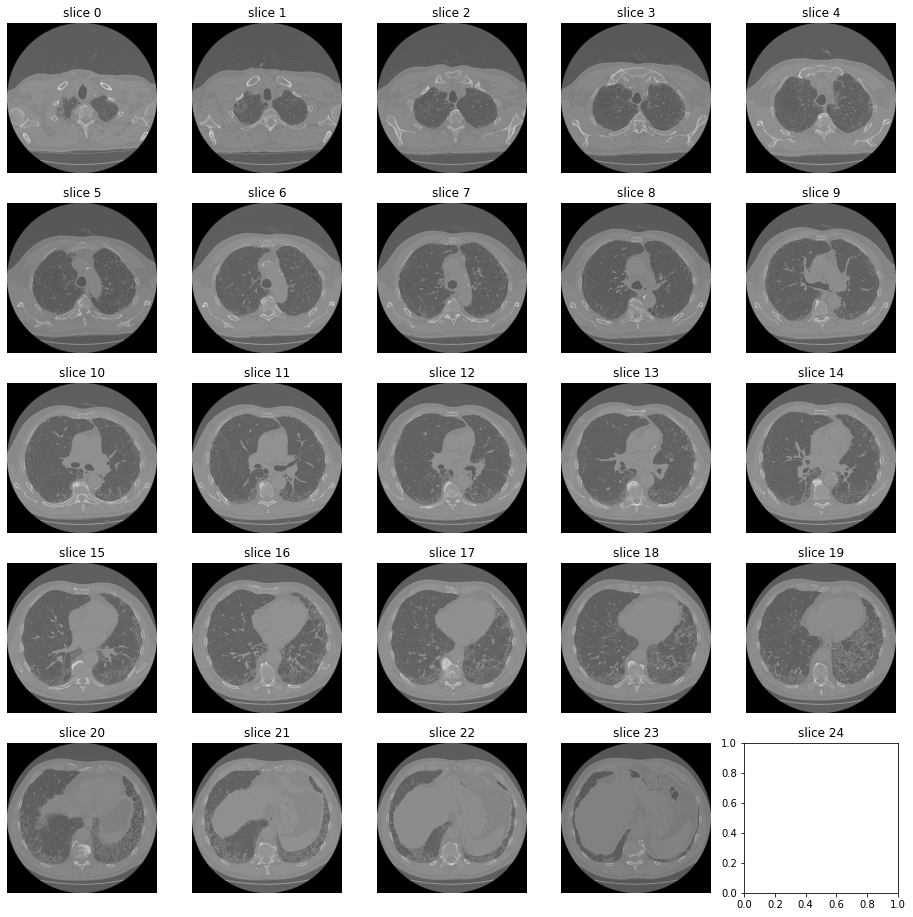

##################################################################################


########################## KAGGLE PROCESSED DATA #################################
PATH --> ../input/osic-pulmonary-fibrosis-progression/archive/mask_noise/mask_noise/ID00094637202205333947361
N Images --> 24


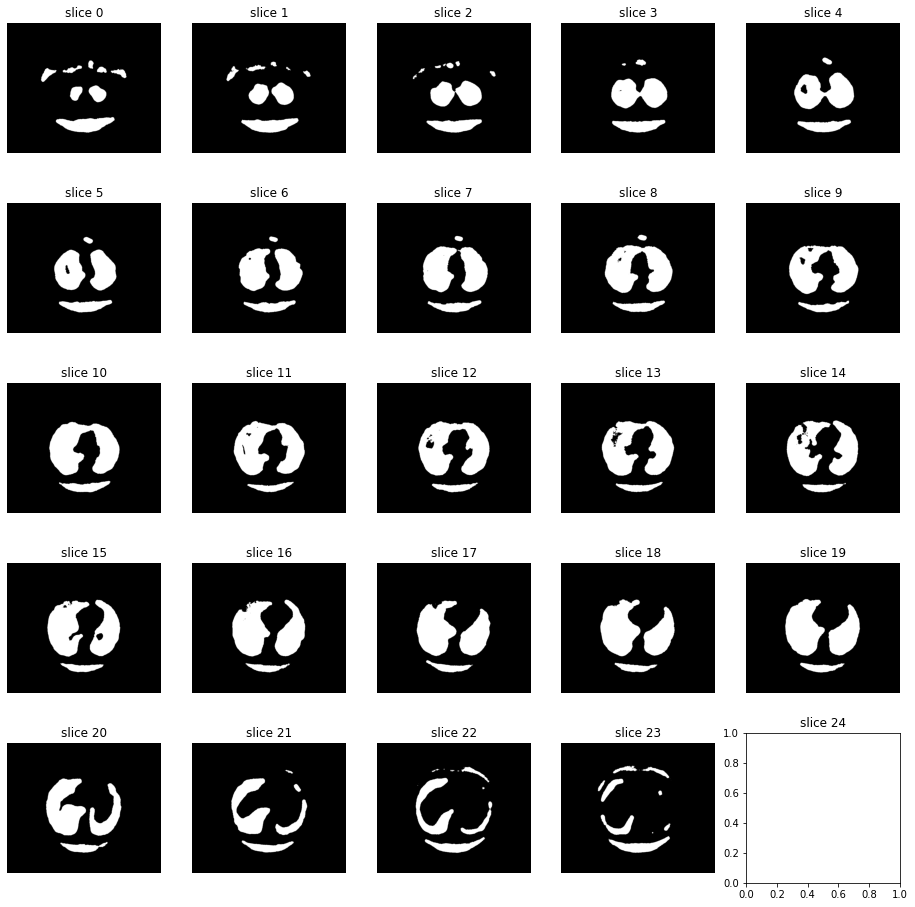

##################################################################################


########################## RESAMPLING AND LUNG MASK #################################
Shape before resampling	 (24, 512, 512)
Spacing Present in DICOM --> [10.        0.703125  0.703125]
Resize Factor --> [10.        0.703125  0.703125]
Raw Image Shape --> (24, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.        0.703125  0.703125]
New Spacing --> [1. 1. 1.]
Shape after resampling	 (240, 360, 360)



167


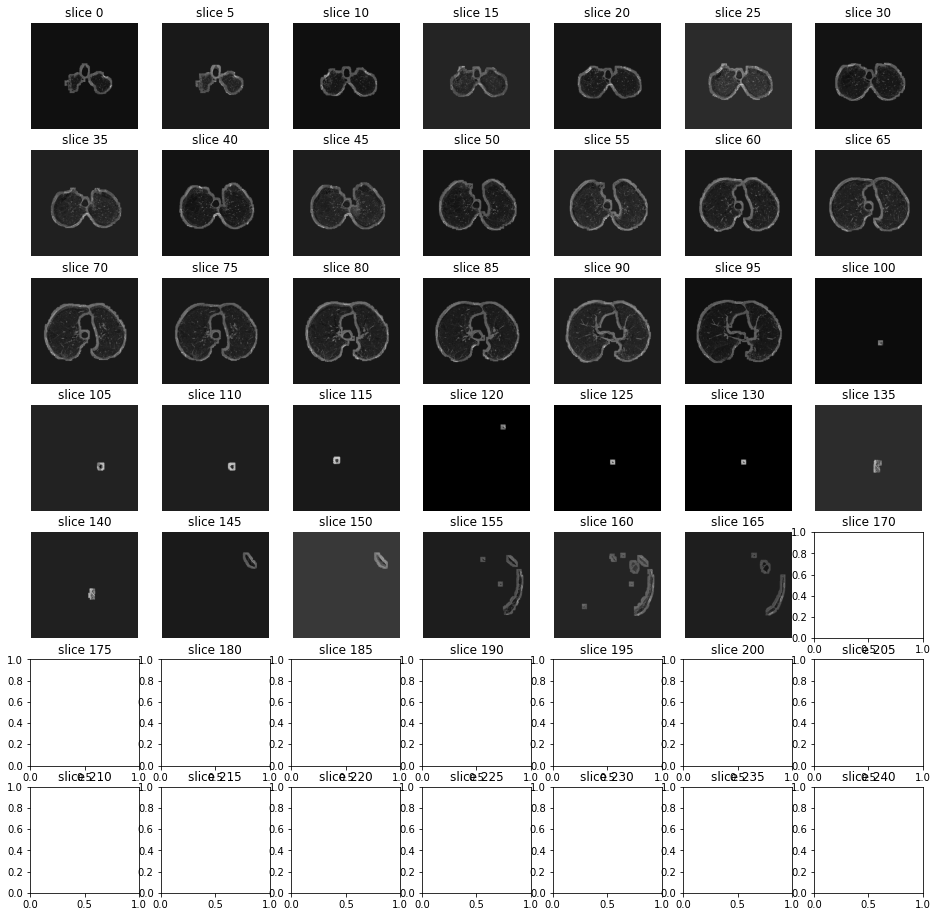

##################################################################################


In [138]:
patient, st  = load_scan(PATH, patient_label, p_id_tmp)
imgs_to_process = get_pixels_hu(patient)
if len(imgs_to_process) > 100: dim = int(np.sqrt(int(len(imgs_to_process)/10)))+1; show_every = 10
else: dim = int(np.sqrt(len(imgs_to_process)))+1; show_every=1
print("########################## RAW DICOM IMAGE SLICE #################################")
print(f"PATH --> {PATH}")
print(f"Raw Shape --> {imgs_to_process.shape}") 
print(f"N Images --> {len(imgs_to_process)}")
print(f"Slice Thickness --> {st}")
sample_stack(imgs_to_process, rows=dim, cols=dim, start_with=0, show_every=show_every)
print("##################################################################################")

data_path = PROCESSED_DATA_PATH + p_id_tmp
images = os.listdir(data_path)
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
slices = [Image.open(f"{PROCESSED_DATA_PATH}/{p_id_tmp}/{sorted_images[index]}") for index, file in enumerate(sorted_images)]
if len(slices) > 100: dim = int(np.sqrt(int(len(slices)/10)))+1; show_every = 10
else: dim = int(np.sqrt(len(slices)))+1; show_every=1
print("\n\n########################## KAGGLE PROCESSED DATA #################################")
print(f"PATH --> {data_path}")
print(f"N Images --> {len(slices)}")
sample_stack(slices, rows=dim, cols=dim, start_with=0, show_every=show_every)
print("##################################################################################")

print("\n\n########################## RESAMPLING AND LUNG MASK #################################")
print("Shape before resampling\t", imgs_to_process.shape)
patient, st = load_scan(PATH, patient_label, p_id_tmp)
imgs_to_process = get_pixels_hu(patient)
imgs_after_resamp, spacing = resample(imgs_to_process, patient, st, resample_size)
print("Shape after resampling\t", imgs_after_resamp.shape)
masked_lung = []
for img in tqdm(imgs_after_resamp):
    masked_lung.append(make_lungmask(img))
if len(masked_lung) > 100: dim = int(np.sqrt(int(len(masked_lung)/5)))+1; show_every = 5
else: dim = int(np.sqrt(len(masked_lung)))+1; show_every=1


masked_lung_tmp = [masked_lung[i] for i in range(len(masked_lung)) if np.max(masked_lung[i])> 0]
print(len(masked_lung_tmp))
sample_stack(masked_lung_tmp, rows=dim, cols=dim, start_with=0, show_every=show_every)
print("##################################################################################")


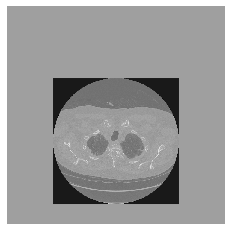

In [2431]:
plot_image(imgs_after_resamp[28])

728


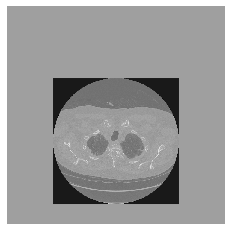

In [2438]:
img = imgs_after_resamp[40]
row_size= img.shape[0]
col_size = img.shape[0]
img = cv2.resize(img, dsize=(col_size, col_size), interpolation=cv2.INTER_CUBIC)
print(row_size)
mean = np.mean(img)
std = np.std(img)
img = img-mean
# img = img/std
plot_image(img)
# # Find the average pixel value near the lungs
# # to renormalize washed out images
middle = img[int(col_size/5):int(col_size/5*4),int(row_size/5):int(row_size/5*4)] 
mean = np.mean(middle)  
max = np.max(img)
min = np.min(img)
# # To improve threshold finding, I'm moving the 
# # underflow and overflow on the pixel spectrum
img[img==max]=mean
img[img==min]=mean
# plot_image(img)
# #
# # Using Kmeans to separate foreground (soft tissue / bone) and background (lung/air)
# #
kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
centers = sorted(kmeans.cluster_centers_.flatten())
threshold = np.mean(centers)
# print(threshold)
thresh_img = np.where(img<threshold,1.0,0.0)  # threshold the image
# plot_image(img)
# # First erode away the finer elements, then dilate to include some of the pixels surrounding the lung.  
# # We don't want to accidentally clip the lung.

eroded = morphology.erosion(thresh_img,np.ones([3,3]))
dilation = morphology.dilation(eroded,np.ones([8,8]))

labels = measure.label(dilation) # Different labels are displayed in different colors
label_vals = np.unique(labels)
regions = measure.regionprops(labels)
good_labels = []
for prop in regions:
    B = prop.bbox
    if B[2]-B[0]<row_size/10*9 and B[3]-B[1]<col_size/10*9 and B[0]>row_size/5 and B[2]<col_size/5*4:
        good_labels.append(prop.label)
mask = np.ndarray([row_size,col_size],dtype=np.int8)
# plot_image(mask)
mask[:] = 0

#
#  After just the lungs are left, we do another large dilation
#  in order to fill in and out the lung mask 
#
for N in good_labels:
    mask = mask + np.where(labels==N,1,0)
mask = morphology.dilation(mask,np.ones([10,10])) # one last dilation
# plot_image(mask)
# if (display):
#     fig, ax = plt.subplots(3, 2, figsize=[12, 12])
#     ax[0, 0].set_title("Original")
#     ax[0, 0].imshow(img, cmap='gray')
#     ax[0, 0].axis('off')
#     ax[0, 1].set_title("Threshold")
#     ax[0, 1].imshow(thresh_img, cmap='gray')
#     ax[0, 1].axis('off')
#     ax[1, 0].set_title("After Erosion and Dilation")
#     ax[1, 0].imshow(dilation, cmap='gray')
#     ax[1, 0].axis('off')
#     ax[1, 1].set_title("Color Labels")
#     ax[1, 1].imshow(labels)
#     ax[1, 1].axis('off')
#     ax[2, 0].set_title("Final Mask")
#     ax[2, 0].imshow(mask, cmap='gray')
#     ax[2, 0].axis('off')
#     ax[2, 1].set_title("Apply Mask on Original")
#     ax[2, 1].imshow(mask*img, cmap='gray')
#     ax[2, 1].axis('off')

#     plt.show()
# plot_image(mask*img)

### average of images

N Images in an array --> 169
## Processed and averaged slices with width - 10 MM at a time images to generate 17 images
[(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80), (80, 90), (90, 100), (100, 110), (110, 120), (120, 130), (130, 140), (140, 150), (150, 160), (160, 169)]
Output N Images --> 17


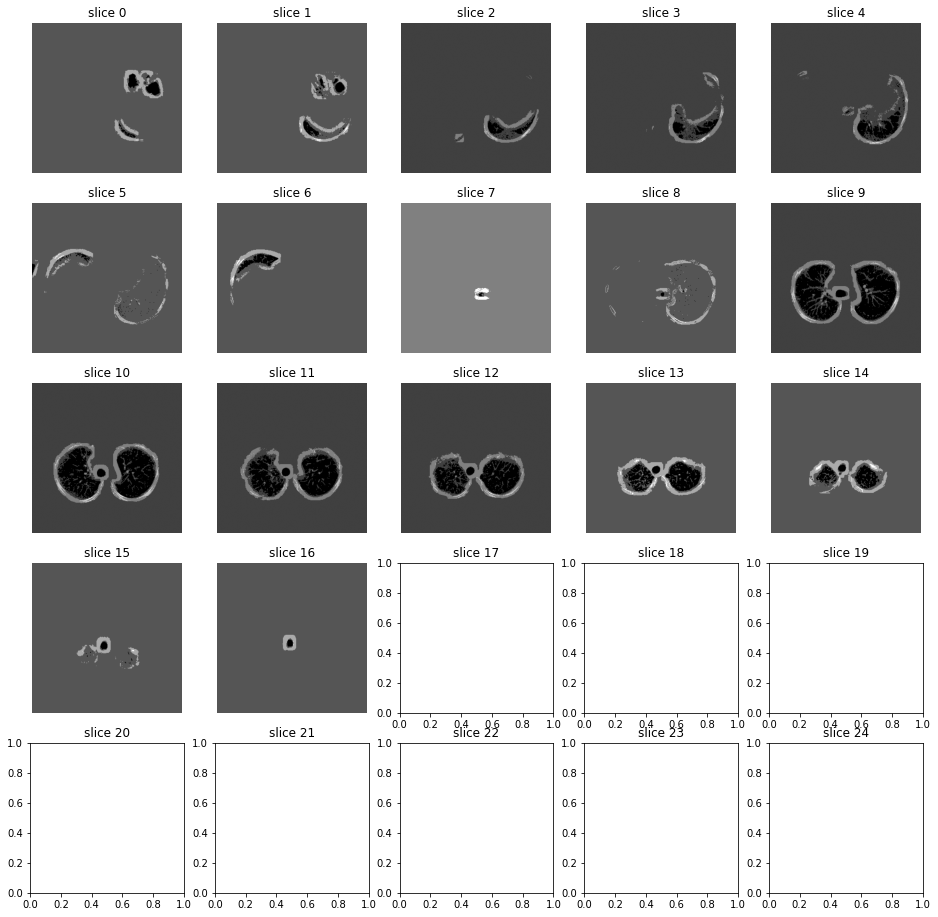

In [5]:
imgs_avg = average_images(masked_lung_tmp, n_imgs_after_average, width_average)
print(f'Output N Images --> {len(imgs_avg)}')
dim = int(np.sqrt(len(imgs_avg)))+1
sample_stack(imgs_avg, rows=dim, cols=dim, start_with=0, show_every=1)


In [6]:
# [f'Min --> {np.min(min_max_scale(imgs_avg[i]))} Max --> {np.max(min_max_scale(imgs_avg[i]))}' for i in range(len(imgs_avg))]

### Removing empty images

17


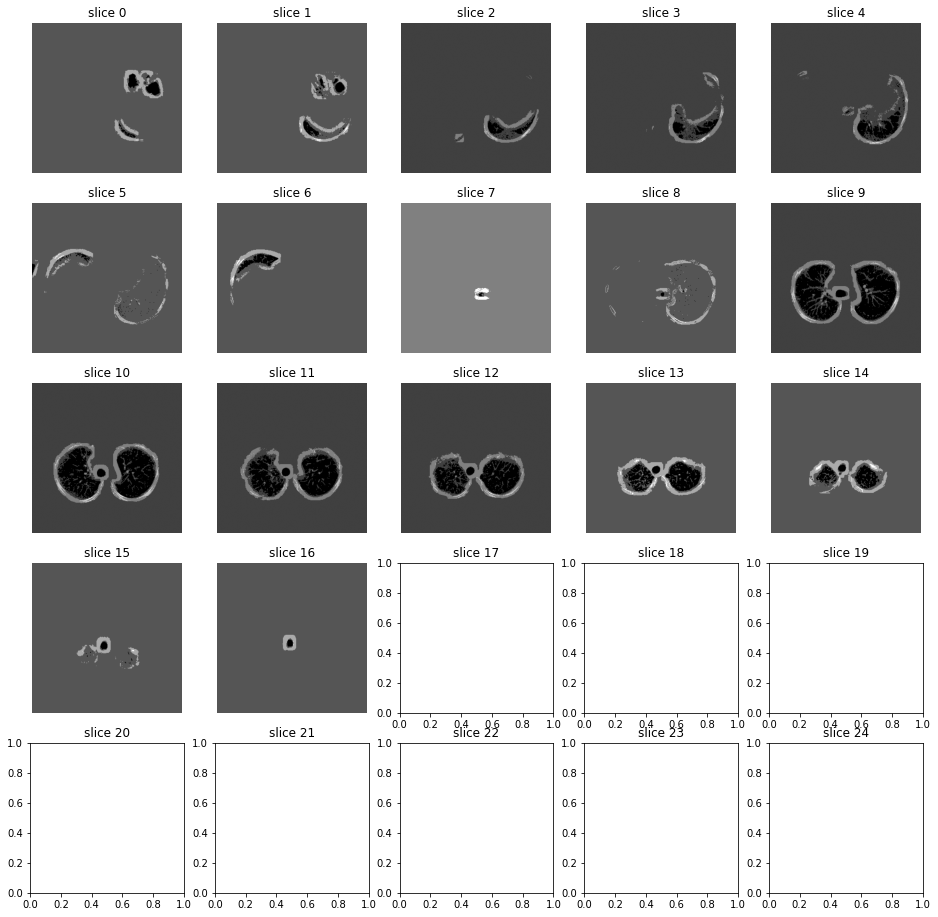

In [7]:
# len(imgs_avg)
tmp = [imgs_avg[i] for i in range(len(imgs_avg)) if np.max(imgs_avg[i])> 0]
print(len(tmp))
sample_stack(tmp, rows=dim, cols=dim, start_with=0, show_every=1)
      

# Generate lung mask 1mm

In [3]:
resample_size = [1,1,1]
df_patient = pd.read_csv("/Users/paritoshgupta/Desktop/osic_patient_level_info_final.csv")
print(df_patient.shape)
print(f"N Patients --> {df_patient.Patient.nunique()}")
# df_patient.isna().sum()

(180, 18)
N Patients --> 176


In [5]:
df_patient = df_patient.groupby('Patient').head(1).reset_index(drop=True)
df_patient.n_images_post_normalized.describe()

count    176.000000
mean     288.681818
std       77.785499
min       30.000000
25%      260.000000
50%      295.500000
75%      320.000000
max      602.000000
Name: n_images_post_normalized, dtype: float64

In [6]:
train_patients = list(df_patient[df_patient.label=="train"].Patient.values)
test_patients = list(df_patient[df_patient.label=="test"].Patient.values)
print(len(train_patients))
print(len(test_patients))

171
5


In [7]:
def create_lung_mask_patient_1mm(path, patients, patient_label, output_path, resample_size):
    for pat_id in tqdm(patients): 
        try:
            print("\n\n#######################################################")
            print(f"********** Processing for Patient ID --> {pat_id} **********")
            tmp_path = os.path.join(path, patient_label, pat_id)
            patient, st = load_scan(path, patient_label, pat_id)
            imgs_to_process = get_pixels_hu(patient)
            imgs_after_resamp, spacing = resample(imgs_to_process, patient, st, resample_size)
            masked_lung = []
            for img in tqdm(imgs_after_resamp):
                try:
                    masked_lung.append(make_lungmask(img))
                except:
                    pass
            masked_lung_new = [masked_lung[i] for i in range(len(masked_lung)) if np.max(masked_lung[i])> 0]
            print("# Dropping empty images...")
            print(f"- N Images (Pre --> {len(masked_lung)}, Post --> {len(masked_lung_new)})")
            print("# Min Max Scaling to get values between 0 and 255")
            masked_lung_scaled = [min_max_scale(img) for img in masked_lung_new]
            dir_path = os.path.join(output_path, pat_id)
            os.makedirs(dir_path, exist_ok=True)
            print(f"** Saving images for Patient --> {pat_id} @ Path --> {dir_path}")
            for i, lung_img in enumerate(masked_lung_scaled):
                img = Image.fromarray(lung_img)
                plt.imsave(f'{output_path}/{pat_id}/{i+1}.png', img, cmap='gray')
            print("#######################################################")
        except:
            pass
            

In [13]:
create_lung_mask_patient_1mm(path = PATH, 
                             patients = train_patients, 
                             patient_label = "train",
                             output_path = OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, 
                             resample_size = resample_size)



#######################################################
********** Processing for Patient ID --> ID00165637202237320314458 **********
Spacing Present in DICOM --> [20.        0.726562  0.726562]
Resize Factor --> [20.        0.726562  0.726562]
Raw Image Shape --> (12, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [20.         0.7265625  0.7265625]
New Spacing --> [1.         0.99999931 0.99999931]



# Dropping empty images...
- N Images (Pre --> 240, Post --> 240)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00165637202237320314458 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00165637202237320314458
#######################################################


#######################################################
********** Processing for Patient ID --> ID00248637202266698862378 **********
Spacing Present in DICOM --> [15.       0.46875  0.46875]
Resize Factor --> [15.       0.46875  0.46875]
Raw Image Shape --> (16, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [15.       0.46875  0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 240, Post --> 240)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00248637202266698862378 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00248637202266698862378
#######################################################


#######################################################
********** Processing for Patient ID --> ID00229637202260254240583 **********
Spacing Present in DICOM --> [20.     0.782  0.782]
Resize Factor --> [20.     0.782  0.782]
Raw Image Shape --> (17, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [20.       0.78125  0.78125]
New Spacing --> [1.      1.00096 1.00096]



# Dropping empty images...
- N Images (Pre --> 340, Post --> 340)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00229637202260254240583 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00229637202260254240583
#######################################################


#######################################################
********** Processing for Patient ID --> ID00126637202218610655908 **********
Spacing Present in DICOM --> [15.        0.703125  0.703125]
Resize Factor --> [15.        0.703125  0.703125]
Raw Image Shape --> (17, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [15.        0.703125  0.703125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 255, Post --> 203)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00126637202218610655908 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00126637202218610655908
#######################################################


#######################################################
********** Processing for Patient ID --> ID00214637202257820847190 **********
Spacing Present in DICOM --> [15.       0.46875  0.46875]
Resize Factor --> [15.       0.46875  0.46875]
Raw Image Shape --> (18, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [15.       0.46875  0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 270, Post --> 270)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00214637202257820847190 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00214637202257820847190
#######################################################


#######################################################
********** Processing for Patient ID --> ID00242637202264759739921 **********
Spacing Present in DICOM --> [15.       0.46875  0.46875]
Resize Factor --> [15.       0.46875  0.46875]
Raw Image Shape --> (18, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [15.       0.46875  0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 270, Post --> 270)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00242637202264759739921 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00242637202264759739921
#######################################################


#######################################################
********** Processing for Patient ID --> ID00216637202257988213445 **********
Spacing Present in DICOM --> [10.       0.46875  0.46875]
Resize Factor --> [10.       0.46875  0.46875]
Raw Image Shape --> (21, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.       0.46875  0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 210, Post --> 210)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00216637202257988213445 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00216637202257988213445
#######################################################


#######################################################
********** Processing for Patient ID --> ID00125637202218590429387 **********
Spacing Present in DICOM --> [15.        0.787109  0.787109]
Resize Factor --> [15.        0.787109  0.787109]
Raw Image Shape --> (22, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [15.          0.78710938  0.78710938]
New Spacing --> [1.         0.99999952 0.99999952]



# Dropping empty images...
- N Images (Pre --> 330, Post --> 330)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00125637202218590429387 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00125637202218590429387
#######################################################


#######################################################
********** Processing for Patient ID --> ID00025637202179541264076 **********
Spacing Present in DICOM --> [10.        0.445313  0.445313]
Resize Factor --> [10.        0.445313  0.445313]
Raw Image Shape --> (24, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.         0.4453125  0.4453125]
New Spacing --> [1.         1.00000112 1.00000112]



# Dropping empty images...
- N Images (Pre --> 240, Post --> 176)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00025637202179541264076 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00025637202179541264076
#######################################################


#######################################################
********** Processing for Patient ID --> ID00401637202305320178010 **********
Spacing Present in DICOM --> [10.        0.703125  0.703125]
Resize Factor --> [10.        0.703125  0.703125]
Raw Image Shape --> (24, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.        0.703125  0.703125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 240, Post --> 240)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00401637202305320178010 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00401637202305320178010
#######################################################


#######################################################
********** Processing for Patient ID --> ID00072637202198161894406 **********
Spacing Present in DICOM --> [10.     0.709  0.709]
Resize Factor --> [10.     0.709  0.709]
Raw Image Shape --> (24, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.70898438  0.70898438]
New Spacing --> [1.         1.00002204 1.00002204]



# Dropping empty images...
- N Images (Pre --> 240, Post --> 240)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00072637202198161894406 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00072637202198161894406
#######################################################


#######################################################
********** Processing for Patient ID --> ID00115637202211874187958 **********
Spacing Present in DICOM --> [10.272094  0.286313  0.286313]
Resize Factor --> [10.272094  0.286313  0.286313]
Raw Image Shape --> (24, 1302, 1302)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.29166667  0.28648233  0.28648233]
New Spacing --> [0.9980982  0.99940892 0.99940892]



# Dropping empty images...
- N Images (Pre --> 247, Post --> 247)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00115637202211874187958 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00115637202211874187958
#######################################################


#######################################################
********** Processing for Patient ID --> ID00094637202205333947361 **********
Spacing Present in DICOM --> [10.        0.703125  0.703125]
Resize Factor --> [10.        0.703125  0.703125]
Raw Image Shape --> (24, 752, 888)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.70345745  0.7027027 ]
New Spacing --> [1.         0.99952741 1.00060096]



# Dropping empty images...
- N Images (Pre --> 240, Post --> 240)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00094637202205333947361 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00094637202205333947361
#######################################################


#######################################################
********** Processing for Patient ID --> ID00099637202206203080121 **********
Spacing Present in DICOM --> [10.          0.43359375  0.43359375]
Resize Factor --> [10.          0.43359375  0.43359375]
Raw Image Shape --> (25, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.43359375  0.43359375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 250, Post --> 190)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00099637202206203080121 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00099637202206203080121
#######################################################


#######################################################
********** Processing for Patient ID --> ID00276637202271694539978 **********
Spacing Present in DICOM --> [10.         0.7109375  0.7109375]
Resize Factor --> [10.         0.7109375  0.7109375]
Raw Image Shape --> (25, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.         0.7109375  0.7109375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 250, Post --> 250)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00276637202271694539978 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00276637202271694539978
#######################################################


#######################################################
********** Processing for Patient ID --> ID00048637202185016727717 **********
Spacing Present in DICOM --> [10.    0.75  0.75]
Resize Factor --> [10.    0.75  0.75]
Raw Image Shape --> (26, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.    0.75  0.75]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 260, Post --> 260)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00048637202185016727717 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00048637202185016727717
#######################################################


#######################################################
********** Processing for Patient ID --> ID00288637202279148973731 **********
Spacing Present in DICOM --> [10.       0.56962  0.56962]
Resize Factor --> [10.       0.56962  0.56962]
Raw Image Shape --> (26, 632, 632)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.56962025  0.56962025]
New Spacing --> [1.         0.99999956 0.99999956]



# Dropping empty images...
- N Images (Pre --> 260, Post --> 260)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00288637202279148973731 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00288637202279148973731
#######################################################


#######################################################
********** Processing for Patient ID --> ID00342637202287526592911 **********
Spacing Present in DICOM --> [10.        0.703125  0.703125]
Resize Factor --> [10.        0.703125  0.703125]
Raw Image Shape --> (27, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.        0.703125  0.703125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 270, Post --> 260)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00342637202287526592911 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00342637202287526592911
#######################################################


#######################################################
********** Processing for Patient ID --> ID00129637202219868188000 **********
Spacing Present in DICOM --> [10.        0.465333  0.465333]
Resize Factor --> [10.        0.465333  0.465333]
Raw Image Shape --> (27, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.46484375  0.46484375]
New Spacing --> [1.        1.0010525 1.0010525]



# Dropping empty images...
- N Images (Pre --> 270, Post --> 263)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00129637202219868188000 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00129637202219868188000
#######################################################


#######################################################
********** Processing for Patient ID --> ID00023637202179104603099 **********
Spacing Present in DICOM --> [10.          0.56640625  0.56640625]
Resize Factor --> [10.          0.56640625  0.56640625]
Raw Image Shape --> (27, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.56640625  0.56640625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 270, Post --> 199)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00023637202179104603099 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00023637202179104603099
#######################################################


#######################################################
********** Processing for Patient ID --> ID00251637202267455595113 **********
Spacing Present in DICOM --> [10.         0.5859375  0.5859375]
Resize Factor --> [10.         0.5859375  0.5859375]
Raw Image Shape --> (28, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.         0.5859375  0.5859375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 280, Post --> 266)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00251637202267455595113 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00251637202267455595113
#######################################################


#######################################################
********** Processing for Patient ID --> ID00161637202235731948764 **********
Spacing Present in DICOM --> [10.      0.6875  0.6875]
Resize Factor --> [10.      0.6875  0.6875]
Raw Image Shape --> (28, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.      0.6875  0.6875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 280, Post --> 188)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00161637202235731948764 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00161637202235731948764
#######################################################


#######################################################
********** Processing for Patient ID --> ID00351637202289476567312 **********
Spacing Present in DICOM --> [10.        0.442708  0.442708]
Resize Factor --> [10.        0.442708  0.442708]
Raw Image Shape --> (29, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.44270833  0.44270833]
New Spacing --> [1.         0.99999925 0.99999925]



# Dropping empty images...
- N Images (Pre --> 290, Post --> 270)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00351637202289476567312 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00351637202289476567312
#######################################################


#######################################################
********** Processing for Patient ID --> ID00307637202282126172865 **********
Spacing Present in DICOM --> [10.          0.70703125  0.70703125]
Resize Factor --> [10.          0.70703125  0.70703125]
Raw Image Shape --> (29, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.70703125  0.70703125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 290, Post --> 290)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00307637202282126172865 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00307637202282126172865
#######################################################


#######################################################
********** Processing for Patient ID --> ID00019637202178323708467 **********
Spacing Present in DICOM --> [10.     0.631  0.631]
Resize Factor --> [10.     0.631  0.631]
Raw Image Shape --> (29, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.63085938  0.63085938]
New Spacing --> [1.         1.00022291 1.00022291]



# Dropping empty images...
- N Images (Pre --> 290, Post --> 290)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00019637202178323708467 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00019637202178323708467
#######################################################


#######################################################
********** Processing for Patient ID --> ID00086637202203494931510 **********
Spacing Present in DICOM --> [10.        0.669922  0.669922]
Resize Factor --> [10.        0.669922  0.669922]
Raw Image Shape --> (30, 788, 888)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.67005076  0.67004505]
New Spacing --> [1.         0.99980783 0.99981636]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00086637202203494931510 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00086637202203494931510
#######################################################


#######################################################
********** Processing for Patient ID --> ID00117637202212360228007 **********
Spacing Present in DICOM --> [10.          0.68554688  0.68554688]
Resize Factor --> [10.          0.68554688  0.68554688]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.68554688  0.68554688]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00117637202212360228007 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00117637202212360228007
#######################################################


#######################################################
********** Processing for Patient ID --> ID00340637202287399835821 **********
Spacing Present in DICOM --> [10.       0.71875  0.71875]
Resize Factor --> [10.       0.71875  0.71875]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.       0.71875  0.71875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00340637202287399835821 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00340637202287399835821
#######################################################


#######################################################
********** Processing for Patient ID --> ID00007637202177411956430 **********
Spacing Present in DICOM --> [10.        0.652344  0.652344]
Resize Factor --> [10.        0.652344  0.652344]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.65234375  0.65234375]
New Spacing --> [1.         1.00000038 1.00000038]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 299)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00007637202177411956430 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00007637202177411956430
#######################################################


#######################################################
********** Processing for Patient ID --> ID00405637202308359492977 **********
Spacing Present in DICOM --> [6.3    0.6875 0.6875]
Resize Factor --> [6.3    0.6875 0.6875]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [6.3    0.6875 0.6875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 189, Post --> 184)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00405637202308359492977 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00405637202308359492977
#######################################################


#######################################################
********** Processing for Patient ID --> ID00062637202188654068490 **********
Spacing Present in DICOM --> [1.        0.7519531 0.7519531]
Resize Factor --> [1.        0.7519531 0.7519531]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.75195312 0.75195312]
New Spacing --> [1.         0.99999997 0.99999997]



# Dropping empty images...
- N Images (Pre --> 30, Post --> 30)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00062637202188654068490 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00062637202188654068490
#######################################################


#######################################################
********** Processing for Patient ID --> ID00335637202286784464927 **********
Spacing Present in DICOM --> [10.     0.702  0.702]
Resize Factor --> [10.     0.702  0.702]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.70117188  0.70117188]
New Spacing --> [1.         1.00118106 1.00118106]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 295)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00335637202286784464927 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00335637202286784464927
#######################################################


#######################################################
********** Processing for Patient ID --> ID00279637202272164826258 **********
Spacing Present in DICOM --> [10.        0.763672  0.763672]
Resize Factor --> [10.        0.763672  0.763672]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.76367188  0.76367188]
New Spacing --> [1.         1.00000016 1.00000016]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00279637202272164826258 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00279637202272164826258
#######################################################


#######################################################
********** Processing for Patient ID --> ID00255637202267923028520 **********
Spacing Present in DICOM --> [10.          0.75390625  0.75390625]
Resize Factor --> [10.          0.75390625  0.75390625]
Raw Image Shape --> (30, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.75390625  0.75390625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00255637202267923028520 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00255637202267923028520
#######################################################


#######################################################
********** Processing for Patient ID --> ID00296637202279895784347 **********
Spacing Present in DICOM --> [10.        0.714844  0.714844]
Resize Factor --> [10.        0.714844  0.714844]
Raw Image Shape --> (31, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.71484375  0.71484375]
New Spacing --> [1.         1.00000035 1.00000035]



# Dropping empty images...
- N Images (Pre --> 310, Post --> 310)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00296637202279895784347 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00296637202279895784347
#######################################################


#######################################################
********** Processing for Patient ID --> ID00014637202177757139317 **********
Spacing Present in DICOM --> [10.        0.798828  0.798828]
Resize Factor --> [10.        0.798828  0.798828]
Raw Image Shape --> (31, 843, 888)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.79833926  0.79842342]
New Spacing --> [1.         1.00061219 1.00050672]



# Dropping empty images...
- N Images (Pre --> 310, Post --> 310)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00014637202177757139317 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00014637202177757139317
#######################################################


#######################################################
********** Processing for Patient ID --> ID00285637202278913507108 **********
Spacing Present in DICOM --> [10.        0.498698  0.498698]
Resize Factor --> [10.        0.498698  0.498698]
Raw Image Shape --> (31, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.49869792  0.49869792]
New Spacing --> [1.         1.00000017 1.00000017]



# Dropping empty images...
- N Images (Pre --> 310, Post --> 254)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00285637202278913507108 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00285637202278913507108
#######################################################


#######################################################
********** Processing for Patient ID --> ID00172637202238316925179 **********
Spacing Present in DICOM --> [10.     0.761  0.761]
Resize Factor --> [10.     0.761  0.761]
Raw Image Shape --> (31, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.76171875  0.76171875]
New Spacing --> [1.         0.99905641 0.99905641]



# Dropping empty images...
- N Images (Pre --> 310, Post --> 310)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00172637202238316925179 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00172637202238316925179
#######################################################


#######################################################
********** Processing for Patient ID --> ID00383637202300493233675 **********
Spacing Present in DICOM --> [10.       0.65625  0.65625]
Resize Factor --> [10.       0.65625  0.65625]
Raw Image Shape --> (32, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.       0.65625  0.65625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 320, Post --> 258)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00383637202300493233675 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00383637202300493233675
#######################################################


#######################################################
********** Processing for Patient ID --> ID00336637202286801879145 **********
Spacing Present in DICOM --> [10.          0.65039062  0.65039062]
Resize Factor --> [10.          0.65039062  0.65039062]
Raw Image Shape --> (33, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.65039062  0.65039062]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 330, Post --> 305)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00336637202286801879145 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00336637202286801879145
#######################################################


#######################################################
********** Processing for Patient ID --> ID00364637202296074419422 **********
Spacing Present in DICOM --> [10.          0.71289062  0.71289062]
Resize Factor --> [10.          0.71289062  0.71289062]
Raw Image Shape --> (33, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.71289062  0.71289062]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 330, Post --> 238)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00364637202296074419422 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00364637202296074419422
#######################################################


#######################################################
********** Processing for Patient ID --> ID00240637202264138860065 **********
Spacing Present in DICOM --> [10.        0.742188  0.742188]
Resize Factor --> [10.        0.742188  0.742188]
Raw Image Shape --> (33, 752, 888)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.74202128  0.74211712]
New Spacing --> [1.         1.00022469 1.00009551]



# Dropping empty images...
- N Images (Pre --> 330, Post --> 330)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00240637202264138860065 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00240637202264138860065
#######################################################


#######################################################
********** Processing for Patient ID --> ID00298637202280361773446 **********
Spacing Present in DICOM --> [10.     0.625  0.625]
Resize Factor --> [10.     0.625  0.625]
Raw Image Shape --> (33, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.     0.625  0.625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 330, Post --> 323)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00298637202280361773446 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00298637202280361773446
#######################################################


#######################################################
********** Processing for Patient ID --> ID00294637202279614924243 **********
Spacing Present in DICOM --> [10.        0.683594  0.683594]
Resize Factor --> [10.        0.683594  0.683594]
Raw Image Shape --> (35, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.68359375  0.68359375]
New Spacing --> [1.         1.00000037 1.00000037]



# Dropping empty images...
- N Images (Pre --> 350, Post --> 350)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00294637202279614924243 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00294637202279614924243
#######################################################


#######################################################
********** Processing for Patient ID --> ID00089637202204675567570 **********
Spacing Present in DICOM --> [10.          0.40755208  0.40755208]
Resize Factor --> [10.          0.40755208  0.40755208]
Raw Image Shape --> (36, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.40755208  0.40755208]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 360, Post --> 332)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00089637202204675567570 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00089637202204675567570
#######################################################


#######################################################
********** Processing for Patient ID --> ID00408637202308839708961 **********
Spacing Present in DICOM --> [7.         0.72460938 0.72460938]
Resize Factor --> [7.         0.72460938 0.72460938]
Raw Image Shape --> (36, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [7.         0.72460938 0.72460938]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 252, Post --> 235)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00408637202308839708961 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00408637202308839708961
#######################################################


#######################################################
********** Processing for Patient ID --> ID00093637202205278167493 **********
Spacing Present in DICOM --> [10.          0.88085938  0.88085938]
Resize Factor --> [10.          0.88085938  0.88085938]
Raw Image Shape --> (37, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.88085938  0.88085938]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 370, Post --> 292)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00093637202205278167493 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00093637202205278167493
#######################################################


#######################################################
********** Processing for Patient ID --> ID00355637202295106567614 **********
Spacing Present in DICOM --> [10.        0.679688  0.679688]
Resize Factor --> [10.        0.679688  0.679688]
Raw Image Shape --> (37, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.         0.6796875  0.6796875]
New Spacing --> [1.         1.00000074 1.00000074]



# Dropping empty images...
- N Images (Pre --> 370, Post --> 370)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00355637202295106567614 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00355637202295106567614
#######################################################


#######################################################
********** Processing for Patient ID --> ID00234637202261078001846 **********
Spacing Present in DICOM --> [8.    0.665 0.665]
Resize Factor --> [8.    0.665 0.665]
Raw Image Shape --> (38, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [8.        0.6640625 0.6640625]
New Spacing --> [1.         1.00141176 1.00141176]



# Dropping empty images...
- N Images (Pre --> 304, Post --> 304)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00234637202261078001846 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00234637202261078001846
#######################################################


#######################################################
********** Processing for Patient ID --> ID00319637202283897208687 **********
Spacing Present in DICOM --> [10.          0.63867188  0.63867188]
Resize Factor --> [10.          0.63867188  0.63867188]
Raw Image Shape --> (38, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.63867188  0.63867188]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 380, Post --> 331)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00319637202283897208687 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00319637202283897208687
#######################################################


#######################################################
********** Processing for Patient ID --> ID00343637202287577133798 **********
Spacing Present in DICOM --> [8.      0.46875 0.46875]
Resize Factor --> [8.      0.46875 0.46875]
Raw Image Shape --> (39, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [8.      0.46875 0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 312, Post --> 285)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00343637202287577133798 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00343637202287577133798
#######################################################


#######################################################
********** Processing for Patient ID --> ID00128637202219474716089 **********
Spacing Present in DICOM --> [1.       0.416667 0.416667]
Resize Factor --> [1.       0.416667 0.416667]
Raw Image Shape --> (48, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.41666667 0.41666667]
New Spacing --> [1.        1.0000008 1.0000008]



# Dropping empty images...
- N Images (Pre --> 48, Post --> 39)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00128637202219474716089 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00128637202219474716089
#######################################################


#######################################################
********** Processing for Patient ID --> ID00398637202303897337979 **********
Spacing Present in DICOM --> [5.         0.69335938 0.69335938]
Resize Factor --> [5.         0.69335938 0.69335938]
Raw Image Shape --> (49, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.69335938 0.69335938]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 245, Post --> 245)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00398637202303897337979 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00398637202303897337979
#######################################################


#######################################################
********** Processing for Patient ID --> ID00012637202177665765362 **********
Spacing Present in DICOM --> [7.    0.625 0.625]
Resize Factor --> [7.    0.625 0.625]
Raw Image Shape --> (49, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [7.    0.625 0.625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 343, Post --> 292)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00012637202177665765362 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00012637202177665765362
#######################################################


#######################################################
********** Processing for Patient ID --> ID00127637202219096738943 **********
Spacing Present in DICOM --> [1.        0.6484375 0.6484375]
Resize Factor --> [1.        0.6484375 0.6484375]
Raw Image Shape --> (50, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.        0.6484375 0.6484375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 50, Post --> 50)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00127637202219096738943 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00127637202219096738943
#######################################################


#######################################################
********** Processing for Patient ID --> ID00133637202223847701934 **********
Spacing Present in DICOM --> [1.       0.701172 0.701172]
Resize Factor --> [1.       0.701172 0.701172]
Raw Image Shape --> (52, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.70117188 0.70117188]
New Spacing --> [1.         1.00000018 1.00000018]



# Dropping empty images...
- N Images (Pre --> 52, Post --> 51)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00133637202223847701934 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00133637202223847701934
#######################################################


#######################################################
********** Processing for Patient ID --> ID00105637202208831864134 **********
Spacing Present in DICOM --> [4.999908 0.533854 0.533854]
Resize Factor --> [4.999908 0.533854 0.533854]
Raw Image Shape --> (53, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.53385417 0.53385417]
New Spacing --> [0.9999816  0.99999969 0.99999969]





#######################################################
********** Processing for Patient ID --> ID00224637202259281193413 **********


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide


Spacing Present in DICOM --> [1.         0.74609375 0.74609375]
Resize Factor --> [1.         0.74609375 0.74609375]
Raw Image Shape --> (54, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.74609375 0.74609375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 54, Post --> 46)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00224637202259281193413 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00224637202259281193413
#######################################################


#######################################################
********** Processing for Patient ID --> ID00407637202308788732304 **********
Spacing Present in DICOM --> [5.      0.78125 0.78125]
Resize Factor --> [5.      0.78125 0.78125]
Raw Image Shape --> (54, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.      0.78125 0.78125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 270, Post --> 261)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00407637202308788732304 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00407637202308788732304
#######################################################


#######################################################
********** Processing for Patient ID --> ID00417637202310901214011 **********
Spacing Present in DICOM --> [5.         0.75390625 0.75390625]
Resize Factor --> [5.         0.75390625 0.75390625]
Raw Image Shape --> (56, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.75390625 0.75390625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 280, Post --> 280)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00417637202310901214011 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00417637202310901214011
#######################################################


#######################################################
********** Processing for Patient ID --> ID00392637202302319160044 **********
Spacing Present in DICOM --> [5.         0.68359375 0.68359375]
Resize Factor --> [5.         0.68359375 0.68359375]
Raw Image Shape --> (56, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.68359375 0.68359375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 280, Post --> 280)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00392637202302319160044 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00392637202302319160044
#######################################################


#######################################################
********** Processing for Patient ID --> ID00339637202287377736231 **********
Spacing Present in DICOM --> [1.       0.703125 0.703125]
Resize Factor --> [1.       0.703125 0.703125]
Raw Image Shape --> (56, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.       0.703125 0.703125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 56, Post --> 56)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00339637202287377736231 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00339637202287377736231
#######################################################


#######################################################
********** Processing for Patient ID --> ID00183637202241995351650 **********
Spacing Present in DICOM --> [0.625    0.473959 0.473959]
Resize Factor --> [0.625    0.473959 0.473959]
Raw Image Shape --> (56, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.625      0.47395833 0.47395833]
New Spacing --> [1.         1.00000141 1.00000141]



# Dropping empty images...
- N Images (Pre --> 35, Post --> 28)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00183637202241995351650 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00183637202241995351650
#######################################################


#######################################################
********** Processing for Patient ID --> ID00130637202220059448013 **********
Spacing Present in DICOM --> [5.         0.66015625 0.66015625]
Resize Factor --> [5.         0.66015625 0.66015625]
Raw Image Shape --> (57, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.66015625 0.66015625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 285, Post --> 285)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00130637202220059448013 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00130637202220059448013
#######################################################


#######################################################
********** Processing for Patient ID --> ID00222637202259066229764 **********
Spacing Present in DICOM --> [1.         0.66601562 0.66601562]
Resize Factor --> [1.         0.66601562 0.66601562]
Raw Image Shape --> (58, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.66601562 0.66601562]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 58, Post --> 51)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00222637202259066229764 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00222637202259066229764
#######################################################


#######################################################
********** Processing for Patient ID --> ID00341637202287410878488 **********
Spacing Present in DICOM --> [1.         0.62109375 0.62109375]
Resize Factor --> [1.         0.62109375 0.62109375]
Raw Image Shape --> (60, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.62109375 0.62109375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 60, Post --> 60)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00341637202287410878488 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00341637202287410878488
#######################################################


#######################################################
********** Processing for Patient ID --> ID00264637202270643353440 **********
Spacing Present in DICOM --> [5.      0.78125 0.78125]
Resize Factor --> [5.      0.78125 0.78125]
Raw Image Shape --> (61, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.      0.78125 0.78125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 305, Post --> 280)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00264637202270643353440 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00264637202270643353440
#######################################################


#######################################################
********** Processing for Patient ID --> ID00305637202281772703145 **********
Spacing Present in DICOM --> [5.         0.65039062 0.65039062]
Resize Factor --> [5.         0.65039062 0.65039062]
Raw Image Shape --> (61, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.65039062 0.65039062]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 305, Post --> 190)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00305637202281772703145 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00305637202281772703145
#######################################################


#######################################################
********** Processing for Patient ID --> ID00299637202280383305867 **********
Spacing Present in DICOM --> [5.         0.69921875 0.69921875]
Resize Factor --> [5.         0.69921875 0.69921875]
Raw Image Shape --> (62, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.69921875 0.69921875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 310, Post --> 297)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00299637202280383305867 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00299637202280383305867
#######################################################


#######################################################
********** Processing for Patient ID --> ID00184637202242062969203 **********
Spacing Present in DICOM --> [5.         0.72265625 0.72265625]
Resize Factor --> [5.         0.72265625 0.72265625]
Raw Image Shape --> (62, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.72265625 0.72265625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 310, Post --> 259)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00184637202242062969203 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00184637202242062969203
#######################################################


#######################################################
********** Processing for Patient ID --> ID00267637202270790561585 **********
Spacing Present in DICOM --> [5.    0.625 0.625]
Resize Factor --> [5.    0.625 0.625]
Raw Image Shape --> (63, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.    0.625 0.625]
New Spacing --> [1. 1. 1.]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide





#######################################################
********** Processing for Patient ID --> ID00076637202199015035026 **********
Spacing Present in DICOM --> [5.    0.781 0.781]
Resize Factor --> [5.    0.781 0.781]
Raw Image Shape --> (64, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.      0.78125 0.78125]
New Spacing --> [1.      0.99968 0.99968]



# Dropping empty images...
- N Images (Pre --> 320, Post --> 320)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00076637202199015035026 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00076637202199015035026
#######################################################


#######################################################
********** Processing for Patient ID --> ID00337637202286839091062 **********
Spacing Present in DICOM --> [5.       0.796875 0.796875]
Resize Factor --> [5.       0.796875 0.796875]
Raw Image Shape --> (64, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.       0.796875 0.796875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 320, Post --> 250)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00337637202286839091062 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00337637202286839091062
#######################################################


#######################################################
********** Processing for Patient ID --> ID00218637202258156844710 **********
Spacing Present in DICOM --> [5.         0.69140625 0.69140625]
Resize Factor --> [5.         0.69140625 0.69140625]
Raw Image Shape --> (64, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.69140625 0.69140625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 320, Post --> 238)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00218637202258156844710 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00218637202258156844710
#######################################################


#######################################################
********** Processing for Patient ID --> ID00207637202252526380974 **********
Spacing Present in DICOM --> [5.    0.671 0.671]
Resize Factor --> [5.    0.671 0.671]
Raw Image Shape --> (64, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.       0.671875 0.671875]
New Spacing --> [1.         0.99869767 0.99869767]



# Dropping empty images...
- N Images (Pre --> 320, Post --> 298)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00207637202252526380974 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00207637202252526380974
#######################################################


#######################################################
********** Processing for Patient ID --> ID00139637202231703564336 **********
Spacing Present in DICOM --> [5.        0.6640625 0.6640625]
Resize Factor --> [5.        0.6640625 0.6640625]
Raw Image Shape --> (64, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.        0.6640625 0.6640625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 320, Post --> 176)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00139637202231703564336 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00139637202231703564336
#######################################################


#######################################################
********** Processing for Patient ID --> ID00365637202296085035729 **********
Spacing Present in DICOM --> [5.         0.60351562 0.60351562]
Resize Factor --> [5.         0.60351562 0.60351562]
Raw Image Shape --> (66, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.60351562 0.60351562]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 330, Post --> 324)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00365637202296085035729 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00365637202296085035729
#######################################################


#######################################################
********** Processing for Patient ID --> ID00232637202260377586117 **********
Spacing Present in DICOM --> [5.    0.683 0.683]
Resize Factor --> [5.    0.683 0.683]
Raw Image Shape --> (67, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.68359375 0.68359375]
New Spacing --> [1.         0.99913143 0.99913143]



# Dropping empty images...
- N Images (Pre --> 335, Post --> 313)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00232637202260377586117 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00232637202260377586117
#######################################################


#######################################################
********** Processing for Patient ID --> ID00090637202204766623410 **********
Spacing Present in DICOM --> [5.      0.78125 0.78125]
Resize Factor --> [5.      0.78125 0.78125]
Raw Image Shape --> (70, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.      0.78125 0.78125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 350, Post --> 202)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00090637202204766623410 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00090637202204766623410
#######################################################


#######################################################
********** Processing for Patient ID --> ID00122637202216437668965 **********
Spacing Present in DICOM --> [5.       0.802734 0.802734]
Resize Factor --> [5.       0.802734 0.802734]
Raw Image Shape --> (71, 734, 888)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.80245232 0.80292793]
New Spacing --> [1.         1.00035103 0.99975847]



# Dropping empty images...
- N Images (Pre --> 355, Post --> 355)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00122637202216437668965 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00122637202216437668965
#######################################################


#######################################################
********** Processing for Patient ID --> ID00119637202215426335765 **********
Spacing Present in DICOM --> [5.         0.86328125 0.86328125]
Resize Factor --> [5.         0.86328125 0.86328125]
Raw Image Shape --> (71, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.86328125 0.86328125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 355, Post --> 353)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00119637202215426335765 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00119637202215426335765
#######################################################


#######################################################
********** Processing for Patient ID --> ID00273637202271319294586 **********
Spacing Present in DICOM --> [5.         0.70703125 0.70703125]
Resize Factor --> [5.         0.70703125 0.70703125]
Raw Image Shape --> (74, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.70703125 0.70703125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 370, Post --> 355)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00273637202271319294586 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00273637202271319294586
#######################################################


#######################################################
********** Processing for Patient ID --> ID00331637202286306023714 **********
Spacing Present in DICOM --> [5.        0.7421875 0.7421875]
Resize Factor --> [5.        0.7421875 0.7421875]
Raw Image Shape --> (74, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.        0.7421875 0.7421875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 370, Post --> 325)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00331637202286306023714 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00331637202286306023714
#######################################################


#######################################################
********** Processing for Patient ID --> ID00199637202248141386743 **********
Spacing Present in DICOM --> [5.    0.668 0.668]
Resize Factor --> [5.    0.668 0.668]
Raw Image Shape --> (87, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.66796875 0.66796875]
New Spacing --> [1.         1.00004678 1.00004678]



# Dropping empty images...
- N Images (Pre --> 435, Post --> 435)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00199637202248141386743 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00199637202248141386743
#######################################################


#######################################################
********** Processing for Patient ID --> ID00077637202199102000916 **********
Spacing Present in DICOM --> [3.        0.6640625 0.6640625]
Resize Factor --> [3.        0.6640625 0.6640625]
Raw Image Shape --> (94, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [3.        0.6640625 0.6640625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 282, Post --> 261)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00077637202199102000916 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00077637202199102000916
#######################################################


#######################################################
********** Processing for Patient ID --> ID00197637202246865691526 **********
Spacing Present in DICOM --> [3.         0.67382812 0.67382812]
Resize Factor --> [3.         0.67382812 0.67382812]
Raw Image Shape --> (102, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [3.         0.67382812 0.67382812]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 306, Post --> 267)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00197637202246865691526 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00197637202246865691526
#######################################################


#######################################################
********** Processing for Patient ID --> ID00047637202184938901501 **********
Spacing Present in DICOM --> [3.         0.69335938 0.69335938]
Resize Factor --> [3.         0.69335938 0.69335938]
Raw Image Shape --> (103, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [3.         0.69335938 0.69335938]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 309, Post --> 228)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00047637202184938901501 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00047637202184938901501
#######################################################


#######################################################
********** Processing for Patient ID --> ID00322637202284842245491 **********
Spacing Present in DICOM --> [2.5      0.691406 0.691406]
Resize Factor --> [2.5      0.691406 0.691406]
Raw Image Shape --> (106, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [2.5        0.69140625 0.69140625]
New Spacing --> [1.         0.99999964 0.99999964]



# Dropping empty images...
- N Images (Pre --> 265, Post --> 211)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00322637202284842245491 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00322637202284842245491
#######################################################


#######################################################
********** Processing for Patient ID --> ID00010637202177584971671 **********
Spacing Present in DICOM --> [3.         0.65429688 0.65429688]
Resize Factor --> [3.         0.65429688 0.65429688]
Raw Image Shape --> (106, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [3.         0.65429688 0.65429688]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 318, Post --> 292)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00010637202177584971671 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00010637202177584971671
#######################################################


#######################################################
********** Processing for Patient ID --> ID00169637202238024117706 **********
Spacing Present in DICOM --> [2.5      0.453125 0.453125]
Resize Factor --> [2.5      0.453125 0.453125]
Raw Image Shape --> (115, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [2.50434783 0.453125   0.453125  ]
New Spacing --> [0.99826389 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 288, Post --> 288)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00169637202238024117706 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00169637202238024117706
#######################################################


#######################################################
********** Processing for Patient ID --> ID00068637202190879923934 **********
Spacing Present in DICOM --> [3.      0.78125 0.78125]
Resize Factor --> [3.      0.78125 0.78125]
Raw Image Shape --> (118, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [3.      0.78125 0.78125]
New Spacing --> [1. 1. 1.]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide





#######################################################
********** Processing for Patient ID --> ID00196637202246668775836 **********
Spacing Present in DICOM --> [3.         0.83007812 0.83007812]
Resize Factor --> [3.         0.83007812 0.83007812]
Raw Image Shape --> (121, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [3.         0.83007812 0.83007812]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 363, Post --> 363)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00196637202246668775836 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00196637202246668775836
#######################################################


#######################################################
********** Processing for Patient ID --> ID00051637202185848464638 **********
Spacing Present in DICOM --> [2.         0.65234375 0.65234375]
Resize Factor --> [2.         0.65234375 0.65234375]
Raw Image Shape --> (122, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [2.         0.65234375 0.65234375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 244, Post --> 223)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00051637202185848464638 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00051637202185848464638
#######################################################


#######################################################
********** Processing for Patient ID --> ID00170637202238079193844 **********
Spacing Present in DICOM --> [1.         0.62890625 0.62890625]
Resize Factor --> [1.         0.62890625 0.62890625]
Raw Image Shape --> (178, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.62890625 0.62890625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 178, Post --> 92)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00170637202238079193844 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00170637202238079193844
#######################################################


#######################################################
********** Processing for Patient ID --> ID00344637202287684217717 **********
Spacing Present in DICOM --> [1.25     0.394531 0.394531]
Resize Factor --> [1.25     0.394531 0.394531]
Raw Image Shape --> (201, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.24875622 0.39453125 0.39453125]
New Spacing --> [1.00099602 0.99999937 0.99999937]



# Dropping empty images...
- N Images (Pre --> 251, Post --> 248)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00344637202287684217717 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00344637202287684217717
#######################################################


#######################################################
********** Processing for Patient ID --> ID00032637202181710233084 **********
Spacing Present in DICOM --> [1.25     0.845703 0.845703]
Resize Factor --> [1.25     0.845703 0.845703]
Raw Image Shape --> (205, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.24878049 0.84570312 0.84570312]
New Spacing --> [1.00097656 0.99999985 0.99999985]



# Dropping empty images...
- N Images (Pre --> 256, Post --> 256)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00032637202181710233084 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00032637202181710233084
#######################################################


#######################################################
********** Processing for Patient ID --> ID00225637202259339837603 **********
Spacing Present in DICOM --> [1.         0.65039062 0.65039062]
Resize Factor --> [1.         0.65039062 0.65039062]
Raw Image Shape --> (207, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.65039062 0.65039062]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 207, Post --> 190)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00225637202259339837603 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00225637202259339837603
#######################################################


#######################################################
********** Processing for Patient ID --> ID00131637202220424084844 **********
Spacing Present in DICOM --> [1.5   0.694 0.694]
Resize Factor --> [1.5   0.694 0.694]
Raw Image Shape --> (210, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.5        0.69335938 0.69335938]
New Spacing --> [1.         1.00092394 1.00092394]



# Dropping empty images...
- N Images (Pre --> 315, Post --> 314)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00131637202220424084844 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00131637202220424084844
#######################################################


#######################################################
********** Processing for Patient ID --> ID00110637202210673668310 **********
Spacing Present in DICOM --> [1.25     0.386719 0.386719]
Resize Factor --> [1.25     0.386719 0.386719]
Raw Image Shape --> (211, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.25118483 0.38671875 0.38671875]
New Spacing --> [0.99905303 1.00000065 1.00000065]



# Dropping empty images...
- N Images (Pre --> 264, Post --> 209)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00110637202210673668310 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00110637202210673668310
#######################################################


#######################################################
********** Processing for Patient ID --> ID00370637202296737666151 **********
Spacing Present in DICOM --> [1.2        0.71484375 0.71484375]
Resize Factor --> [1.2        0.71484375 0.71484375]
Raw Image Shape --> (217, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.19815668 0.71484375 0.71484375]
New Spacing --> [1.00153846 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 260, Post --> 208)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00370637202296737666151 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00370637202296737666151
#######################################################


#######################################################
********** Processing for Patient ID --> ID00167637202237397919352 **********
Spacing Present in DICOM --> [1.25     0.703125 0.703125]
Resize Factor --> [1.25     0.703125 0.703125]
Raw Image Shape --> (221, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.24886878 0.703125   0.703125  ]
New Spacing --> [1.0009058 1.        1.       ]



# Dropping empty images...
- N Images (Pre --> 276, Post --> 262)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00167637202237397919352 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00167637202237397919352
#######################################################


#######################################################
********** Processing for Patient ID --> ID00102637202206574119190 **********
Spacing Present in DICOM --> [1.25     0.703125 0.703125]
Resize Factor --> [1.25     0.703125 0.703125]
Raw Image Shape --> (233, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.24892704 0.703125   0.703125  ]
New Spacing --> [1.00085911 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 291, Post --> 283)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00102637202206574119190 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00102637202206574119190
#######################################################


#######################################################
********** Processing for Patient ID --> ID00026637202179561894768 **********
Spacing Present in DICOM --> [1.       0.486979 0.486979]
Resize Factor --> [1.       0.486979 0.486979]
Raw Image Shape --> (239, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.48697917 0.48697917]
New Spacing --> [1.         0.99999966 0.99999966]



# Dropping empty images...
- N Images (Pre --> 239, Post --> 239)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00026637202179561894768 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00026637202179561894768
#######################################################


#######################################################
********** Processing for Patient ID --> ID00290637202279304677843 **********
Spacing Present in DICOM --> [1.25    0.46875 0.46875]
Resize Factor --> [1.25    0.46875 0.46875]
Raw Image Shape --> (240, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.25    0.46875 0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00290637202279304677843 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00290637202279304677843
#######################################################


#######################################################
********** Processing for Patient ID --> ID00149637202232704462834 **********
Spacing Present in DICOM --> [1.25     0.585938 0.585938]
Resize Factor --> [1.25     0.585938 0.585938]
Raw Image Shape --> (245, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.24897959 0.5859375  0.5859375 ]
New Spacing --> [1.00081699 1.00000085 1.00000085]



# Dropping empty images...
- N Images (Pre --> 306, Post --> 260)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00149637202232704462834 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00149637202232704462834
#######################################################


#######################################################
********** Processing for Patient ID --> ID00192637202245493238298 **********
Spacing Present in DICOM --> [1.        0.8203125 0.8203125]
Resize Factor --> [1.        0.8203125 0.8203125]
Raw Image Shape --> (245, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.        0.8203125 0.8203125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 245, Post --> 244)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00192637202245493238298 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00192637202245493238298
#######################################################


#######################################################
********** Processing for Patient ID --> ID00414637202310318891556 **********
Spacing Present in DICOM --> [1.       0.455729 0.455729]
Resize Factor --> [1.       0.455729 0.455729]
Raw Image Shape --> (250, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.45572917 0.45572917]
New Spacing --> [1.         0.99999963 0.99999963]



# Dropping empty images...
- N Images (Pre --> 250, Post --> 250)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00414637202310318891556 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00414637202310318891556
#######################################################


#######################################################
********** Processing for Patient ID --> ID00241637202264294508775 **********
Spacing Present in DICOM --> [1.    0.782 0.782]
Resize Factor --> [1.    0.782 0.782]
Raw Image Shape --> (253, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.      0.78125 0.78125]
New Spacing --> [1.      1.00096 1.00096]



# Dropping empty images...
- N Images (Pre --> 253, Post --> 253)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00241637202264294508775 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00241637202264294508775
#######################################################


#######################################################
********** Processing for Patient ID --> ID00168637202237852027833 **********
Spacing Present in DICOM --> [1.5        0.73242188 0.73242188]
Resize Factor --> [1.5        0.73242188 0.73242188]
Raw Image Shape --> (253, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.50197628 0.73242188 0.73242188]
New Spacing --> [0.99868421 1.         1.        ]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide





#######################################################
********** Processing for Patient ID --> ID00061637202188184085559 **********
Spacing Present in DICOM --> [1.25  0.759 0.759]
Resize Factor --> [1.25  0.759 0.759]
Raw Image Shape --> (253, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.24901186 0.75976562 0.75976562]
New Spacing --> [1.00079114 0.99899229 0.99899229]



# Dropping empty images...
- N Images (Pre --> 316, Post --> 236)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00061637202188184085559 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00061637202188184085559
#######################################################


#######################################################
********** Processing for Patient ID --> ID00123637202217151272140 **********
Spacing Present in DICOM --> [1.         0.61328125 0.61328125]
Resize Factor --> [1.         0.61328125 0.61328125]
Raw Image Shape --> (258, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.61328125 0.61328125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 258, Post --> 237)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00123637202217151272140 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00123637202217151272140
#######################################################


#######################################################
********** Processing for Patient ID --> ID00323637202285211956970 **********
Spacing Present in DICOM --> [1.         0.62304688 0.62304688]
Resize Factor --> [1.         0.62304688 0.62304688]
Raw Image Shape --> (258, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.62304688 0.62304688]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 258, Post --> 187)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00323637202285211956970 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00323637202285211956970
#######################################################


#######################################################
********** Processing for Patient ID --> ID00329637202285906759848 **********
Spacing Present in DICOM --> [1.         0.75195312 0.75195312]
Resize Factor --> [1.         0.75195312 0.75195312]
Raw Image Shape --> (260, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.75195312 0.75195312]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 260, Post --> 243)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00329637202285906759848 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00329637202285906759848
#######################################################


#######################################################
********** Processing for Patient ID --> ID00400637202305055099402 **********
Spacing Present in DICOM --> [1.2        0.71679688 0.71679688]
Resize Factor --> [1.2        0.71679688 0.71679688]
Raw Image Shape --> (265, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.2        0.71679688 0.71679688]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 318, Post --> 255)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00400637202305055099402 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00400637202305055099402
#######################################################


#######################################################
********** Processing for Patient ID --> ID00367637202296290303449 **********
Spacing Present in DICOM --> [1.         0.53255208 0.53255208]
Resize Factor --> [1.         0.53255208 0.53255208]
Raw Image Shape --> (266, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.53255208 0.53255208]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 266, Post --> 266)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00367637202296290303449 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00367637202296290303449
#######################################################


#######################################################
********** Processing for Patient ID --> ID00082637202201836229724 **********
Spacing Present in DICOM --> [1.      0.46875 0.46875]
Resize Factor --> [1.      0.46875 0.46875]
Raw Image Shape --> (266, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.      0.46875 0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 266, Post --> 251)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00082637202201836229724 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00082637202201836229724
#######################################################


#######################################################
********** Processing for Patient ID --> ID00213637202257692916109 **********
Spacing Present in DICOM --> [1.         0.75195312 0.75195312]
Resize Factor --> [1.         0.75195312 0.75195312]
Raw Image Shape --> (268, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.75195312 0.75195312]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 268, Post --> 247)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00213637202257692916109 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00213637202257692916109
#######################################################


#######################################################
********** Processing for Patient ID --> ID00140637202231728595149 **********
Spacing Present in DICOM --> [1.5        0.74023438 0.74023438]
Resize Factor --> [1.5        0.74023438 0.74023438]
Raw Image Shape --> (271, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.49815498 0.74023438 0.74023438]
New Spacing --> [1.00123153 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 406, Post --> 343)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00140637202231728595149 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00140637202231728595149
#######################################################


#######################################################
********** Processing for Patient ID --> ID00060637202187965290703 **********
Spacing Present in DICOM --> [1.         0.71484375 0.71484375]
Resize Factor --> [1.         0.71484375 0.71484375]
Raw Image Shape --> (275, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.71484375 0.71484375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 275, Post --> 275)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00060637202187965290703 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00060637202187965290703
#######################################################


#######################################################
********** Processing for Patient ID --> ID00411637202309374271828 **********
Spacing Present in DICOM --> [1.      0.78125 0.78125]
Resize Factor --> [1.      0.78125 0.78125]
Raw Image Shape --> (278, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.      0.78125 0.78125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 278, Post --> 278)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00411637202309374271828 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00411637202309374271828
#######################################################


#######################################################
********** Processing for Patient ID --> ID00275637202271440119890 **********
Spacing Present in DICOM --> [1.    0.647 0.647]
Resize Factor --> [1.    0.647 0.647]
Raw Image Shape --> (284, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.64648438 0.64648438]
New Spacing --> [1.         1.00079758 1.00079758]



# Dropping empty images...
- N Images (Pre --> 284, Post --> 284)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00275637202271440119890 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00275637202271440119890
#######################################################


#######################################################
********** Processing for Patient ID --> ID00360637202295712204040 **********
Spacing Present in DICOM --> [1.       0.734375 0.734375]
Resize Factor --> [1.       0.734375 0.734375]
Raw Image Shape --> (291, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.       0.734375 0.734375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 291, Post --> 263)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00360637202295712204040 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00360637202295712204040
#######################################################


#######################################################
********** Processing for Patient ID --> ID00015637202177877247924 **********
Spacing Present in DICOM --> [0.80000305 0.52213542 0.52213542]
Resize Factor --> [0.80000305 0.52213542 0.52213542]
Raw Image Shape --> (295, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.8        0.52213542 0.52213542]
New Spacing --> [1.00000381 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 236, Post --> 236)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00015637202177877247924 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00015637202177877247924
#######################################################


#######################################################
********** Processing for Patient ID --> ID00235637202261451839085 **********
Spacing Present in DICOM --> [1.         0.75390625 0.75390625]
Resize Factor --> [1.         0.75390625 0.75390625]
Raw Image Shape --> (296, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.75390625 0.75390625]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 296, Post --> 296)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00235637202261451839085 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00235637202261451839085
#######################################################


#######################################################
********** Processing for Patient ID --> ID00109637202210454292264 **********
Spacing Present in DICOM --> [1.       0.775391 0.775391]
Resize Factor --> [1.       0.775391 0.775391]
Raw Image Shape --> (300, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.77539062 0.77539062]
New Spacing --> [1.         1.00000048 1.00000048]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00109637202210454292264 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00109637202210454292264
#######################################################


#######################################################
********** Processing for Patient ID --> ID00111637202210956877205 **********
Spacing Present in DICOM --> [1.         0.72070312 0.72070312]
Resize Factor --> [1.         0.72070312 0.72070312]
Raw Image Shape --> (302, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.72070312 0.72070312]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 302, Post --> 291)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00111637202210956877205 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00111637202210956877205
#######################################################


#######################################################
********** Processing for Patient ID --> ID00210637202257228694086 **********
Spacing Present in DICOM --> [1.    0.695 0.695]
Resize Factor --> [1.    0.695 0.695]
Raw Image Shape --> (303, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.        0.6953125 0.6953125]
New Spacing --> [1.         0.99955056 0.99955056]



# Dropping empty images...
- N Images (Pre --> 303, Post --> 303)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00210637202257228694086 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00210637202257228694086
#######################################################


#######################################################
********** Processing for Patient ID --> ID00138637202231603868088 **********
Spacing Present in DICOM --> [1.         0.76953125 0.76953125]
Resize Factor --> [1.         0.76953125 0.76953125]
Raw Image Shape --> (304, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.76953125 0.76953125]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 304, Post --> 174)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00138637202231603868088 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00138637202231603868088
#######################################################


#######################################################
********** Processing for Patient ID --> ID00283637202278714365037 **********
Spacing Present in DICOM --> [1.         0.83984375 0.83984375]
Resize Factor --> [1.         0.83984375 0.83984375]
Raw Image Shape --> (306, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.83984375 0.83984375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 306, Post --> 306)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00283637202278714365037 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00283637202278714365037
#######################################################


#######################################################
********** Processing for Patient ID --> ID00358637202295388077032 **********
Spacing Present in DICOM --> [1.       0.594937 0.594937]
Resize Factor --> [1.       0.594937 0.594937]
Raw Image Shape --> (312, 632, 632)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.59493671 0.59493671]
New Spacing --> [1.         1.00000049 1.00000049]



# Dropping empty images...
- N Images (Pre --> 312, Post --> 296)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00358637202295388077032 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00358637202295388077032
#######################################################


#######################################################
********** Processing for Patient ID --> ID00249637202266730854017 **********
Spacing Present in DICOM --> [0.8   0.714 0.714]
Resize Factor --> [0.8   0.714 0.714]
Raw Image Shape --> (319, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.79937304 0.71484375 0.71484375]
New Spacing --> [1.00078431 0.99881967 0.99881967]



# Dropping empty images...
- N Images (Pre --> 255, Post --> 253)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00249637202266730854017 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00249637202266730854017
#######################################################


#######################################################
********** Processing for Patient ID --> ID00067637202189903532242 **********
Spacing Present in DICOM --> [1.       0.871094 0.871094]
Resize Factor --> [1.       0.871094 0.871094]
Raw Image Shape --> (319, 733, 888)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.87175989 0.87162162]
New Spacing --> [1.         0.99923615 0.99939467]



# Dropping empty images...
- N Images (Pre --> 319, Post --> 319)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00067637202189903532242 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00067637202189903532242
#######################################################


#######################################################
********** Processing for Patient ID --> ID00075637202198610425520 **********
Spacing Present in DICOM --> [0.700012   0.59960938 0.59960938]
Resize Factor --> [0.700012   0.59960938 0.59960938]
Raw Image Shape --> (320, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.7        0.59960938 0.59960938]
New Spacing --> [1.00001714 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 224, Post --> 169)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00075637202198610425520 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00075637202198610425520
#######################################################


#######################################################
********** Processing for Patient ID --> ID00135637202224630271439 **********
Spacing Present in DICOM --> [0.8   0.741 0.741]
Resize Factor --> [0.8   0.741 0.741]
Raw Image Shape --> (337, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.80118694 0.74023438 0.74023438]
New Spacing --> [0.99851852 1.0010343  1.0010343 ]



# Dropping empty images...
- N Images (Pre --> 270, Post --> 261)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00135637202224630271439 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00135637202224630271439
#######################################################


#######################################################
********** Processing for Patient ID --> ID00368637202296470751086 **********
Spacing Present in DICOM --> [1.       0.796875 0.796875]
Resize Factor --> [1.       0.796875 0.796875]
Raw Image Shape --> (341, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.       0.796875 0.796875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 341, Post --> 336)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00368637202296470751086 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00368637202296470751086
#######################################################


#######################################################
********** Processing for Patient ID --> ID00038637202182690843176 **********
Spacing Present in DICOM --> [1.         0.47135417 0.47135417]
Resize Factor --> [1.         0.47135417 0.47135417]
Raw Image Shape --> (346, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.47135417 0.47135417]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 346, Post --> 319)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00038637202182690843176 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00038637202182690843176
#######################################################


#######################################################
********** Processing for Patient ID --> ID00378637202298597306391 **********
Spacing Present in DICOM --> [1.        0.7109375 0.7109375]
Resize Factor --> [1.        0.7109375 0.7109375]
Raw Image Shape --> (346, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.        0.7109375 0.7109375]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 346, Post --> 346)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00378637202298597306391 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00378637202298597306391
#######################################################


#######################################################
********** Processing for Patient ID --> ID00228637202259965313869 **********
Spacing Present in DICOM --> [0.8        0.57617188 0.57617188]
Resize Factor --> [0.8        0.57617188 0.57617188]
Raw Image Shape --> (347, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.80115274 0.57617188 0.57617188]
New Spacing --> [0.99856115 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 278, Post --> 193)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00228637202259965313869 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00228637202259965313869
#######################################################


#######################################################
********** Processing for Patient ID --> ID00073637202198167792918 **********
Spacing Present in DICOM --> [1.         0.75585938 0.75585938]
Resize Factor --> [1.         0.75585938 0.75585938]
Raw Image Shape --> (355, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.75585938 0.75585938]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 355, Post --> 350)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00073637202198167792918 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00073637202198167792918
#######################################################


#######################################################
********** Processing for Patient ID --> ID00027637202179689871102 **********
Spacing Present in DICOM --> [1.         0.59114583 0.59114583]
Resize Factor --> [1.         0.59114583 0.59114583]
Raw Image Shape --> (358, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.59114583 0.59114583]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 358, Post --> 332)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00027637202179689871102 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00027637202179689871102
#######################################################


#######################################################
********** Processing for Patient ID --> ID00190637202244450116191 **********
Spacing Present in DICOM --> [1.       0.697266 0.697266]
Resize Factor --> [1.       0.697266 0.697266]
Raw Image Shape --> (361, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.69726562 0.69726562]
New Spacing --> [1.         1.00000054 1.00000054]



# Dropping empty images...
- N Images (Pre --> 361, Post --> 288)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00190637202244450116191 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00190637202244450116191
#######################################################


#######################################################
********** Processing for Patient ID --> ID00371637202296828615743 **********
Spacing Present in DICOM --> [0.8     0.65625 0.65625]
Resize Factor --> [0.8     0.65625 0.65625]
Raw Image Shape --> (364, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.79945055 0.65625    0.65625   ]
New Spacing --> [1.00068729 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 291, Post --> 268)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00371637202296828615743 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00371637202296828615743
#######################################################


#######################################################
********** Processing for Patient ID --> ID00219637202258203123958 **********
Spacing Present in DICOM --> [1.       0.796875 0.796875]
Resize Factor --> [1.       0.796875 0.796875]
Raw Image Shape --> (375, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.       0.796875 0.796875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 375, Post --> 324)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00219637202258203123958 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00219637202258203123958
#######################################################


#######################################################
********** Processing for Patient ID --> ID00009637202177434476278 **********
Spacing Present in DICOM --> [0.799999 0.486979 0.486979]
Resize Factor --> [0.799999 0.486979 0.486979]
Raw Image Shape --> (394, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.79949239 0.48697917 0.48697917]
New Spacing --> [1.00063367 0.99999966 0.99999966]



# Dropping empty images...
- N Images (Pre --> 315, Post --> 311)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00009637202177434476278 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00009637202177434476278
#######################################################


#######################################################
********** Processing for Patient ID --> ID00376637202297677828573 **********
Spacing Present in DICOM --> [0.8      0.832031 0.832031]
Resize Factor --> [0.8      0.832031 0.832031]
Raw Image Shape --> (396, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.80050505 0.83203125 0.83203125]
New Spacing --> [0.99936909 0.9999997  0.9999997 ]



# Dropping empty images...
- N Images (Pre --> 317, Post --> 317)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00376637202297677828573 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00376637202297677828573
#######################################################


#######################################################
********** Processing for Patient ID --> ID00124637202217596410344 **********
Spacing Present in DICOM --> [0.7        0.81835938 0.81835938]
Resize Factor --> [0.7        0.81835938 0.81835938]
Raw Image Shape --> (398, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.70100503 0.81835938 0.81835938]
New Spacing --> [0.99856631 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 279, Post --> 279)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00124637202217596410344 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00124637202217596410344
#######################################################


#######################################################
********** Processing for Patient ID --> ID00136637202224951350618 **********
Spacing Present in DICOM --> [0.7       0.7421875 0.7421875]
Resize Factor --> [0.7       0.7421875 0.7421875]
Raw Image Shape --> (404, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.70049505 0.7421875  0.7421875 ]
New Spacing --> [0.99929329 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 283, Post --> 283)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00136637202224951350618 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00136637202224951350618
#######################################################


#######################################################
********** Processing for Patient ID --> ID00233637202260580149633 **********
Spacing Present in DICOM --> [0.700012   0.76953125 0.76953125]
Resize Factor --> [0.700012   0.76953125 0.76953125]
Raw Image Shape --> (405, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.70123457 0.76953125 0.76953125]
New Spacing --> [0.99825655 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 284, Post --> 281)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00233637202260580149633 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00233637202260580149633
#######################################################


#######################################################
********** Processing for Patient ID --> ID00132637202222178761324 **********
Spacing Present in DICOM --> [1.       0.457333 0.457333]
Resize Factor --> [1.       0.457333 0.457333]
Raw Image Shape --> (407, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.45703125 0.45703125]
New Spacing --> [1.         1.00066024 1.00066024]



# Dropping empty images...
- N Images (Pre --> 407, Post --> 340)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00132637202222178761324 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00132637202222178761324
#######################################################


#######################################################
********** Processing for Patient ID --> ID00186637202242472088675 **********
Spacing Present in DICOM --> [0.7        0.65429688 0.65429688]
Resize Factor --> [0.7        0.65429688 0.65429688]
Raw Image Shape --> (408, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.70098039 0.65429688 0.65429688]
New Spacing --> [0.9986014 1.        1.       ]



# Dropping empty images...
- N Images (Pre --> 286, Post --> 208)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00186637202242472088675 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00186637202242472088675
#######################################################


#######################################################
********** Processing for Patient ID --> ID00312637202282607344793 **********
Spacing Present in DICOM --> [0.625    0.664062 0.664062]
Resize Factor --> [0.625    0.664062 0.664062]
Raw Image Shape --> (409, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.62591687 0.6640625  0.6640625 ]
New Spacing --> [0.99853516 0.99999925 0.99999925]



# Dropping empty images...
- N Images (Pre --> 256, Post --> 256)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00312637202282607344793 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00312637202282607344793
#######################################################


#######################################################
********** Processing for Patient ID --> ID00381637202299644114027 **********
Spacing Present in DICOM --> [0.5      0.884766 0.884766]
Resize Factor --> [0.5      0.884766 0.884766]
Raw Image Shape --> (423, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.50118203 0.88476562 0.88476562]
New Spacing --> [0.99764151 1.00000042 1.00000042]



# Dropping empty images...
- N Images (Pre --> 212, Post --> 212)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00381637202299644114027 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00381637202299644114027
#######################################################


#######################################################
********** Processing for Patient ID --> ID00388637202301028491611 **********
Spacing Present in DICOM --> [0.699997 0.520833 0.520833]
Resize Factor --> [0.699997 0.520833 0.520833]
Raw Image Shape --> (429, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.6993007  0.52083333 0.52083333]
New Spacing --> [1.00099571 0.99999936 0.99999936]



# Dropping empty images...
- N Images (Pre --> 300, Post --> 300)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00388637202301028491611 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00388637202301028491611
#######################################################


#######################################################
********** Processing for Patient ID --> ID00030637202181211009029 **********
Spacing Present in DICOM --> [0.625    0.884766 0.884766]
Resize Factor --> [0.625    0.884766 0.884766]
Raw Image Shape --> (433, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.62586605 0.88476562 0.88476562]
New Spacing --> [0.99861624 1.00000042 1.00000042]



# Dropping empty images...
- N Images (Pre --> 271, Post --> 271)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00030637202181211009029 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00030637202181211009029
#######################################################


#######################################################
********** Processing for Patient ID --> ID00134637202223873059688 **********
Spacing Present in DICOM --> [0.800049   0.74023438 0.74023438]
Resize Factor --> [0.800049   0.74023438 0.74023438]
Raw Image Shape --> (451, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.80044346 0.74023438 0.74023438]
New Spacing --> [0.9995072 1.        1.       ]



# Dropping empty images...
- N Images (Pre --> 361, Post --> 361)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00134637202223873059688 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00134637202223873059688
#######################################################


#######################################################
********** Processing for Patient ID --> ID00221637202258717315571 **********
Spacing Present in DICOM --> [0.5      0.734375 0.734375]
Resize Factor --> [0.5      0.734375 0.734375]
Raw Image Shape --> (465, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.49892473 0.734375   0.734375  ]
New Spacing --> [1.00215517 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 232, Post --> 182)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00221637202258717315571 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00221637202258717315571
#######################################################


#######################################################
********** Processing for Patient ID --> ID00309637202282195513787 **********
Spacing Present in DICOM --> [0.75     0.481771 0.481771]
Resize Factor --> [0.75     0.481771 0.481771]
Raw Image Shape --> (469, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.75053305 0.48177083 0.48177083]
New Spacing --> [0.99928977 1.00000035 1.00000035]



# Dropping empty images...
- N Images (Pre --> 352, Post --> 215)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00309637202282195513787 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00309637202282195513787
#######################################################


#######################################################
********** Processing for Patient ID --> ID00393637202302431697467 **********
Spacing Present in DICOM --> [0.700013   0.73632812 0.73632812]
Resize Factor --> [0.700013   0.73632812 0.73632812]
Raw Image Shape --> (478, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.70083682 0.73632812 0.73632812]
New Spacing --> [0.99882452 1.         1.        ]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide





#######################################################
********** Processing for Patient ID --> ID00291637202279398396106 **********
Spacing Present in DICOM --> [0.799999 0.536458 0.536458]
Resize Factor --> [0.799999 0.536458 0.536458]
Raw Image Shape --> (485, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.8        0.53645833 0.53645833]
New Spacing --> [0.99999875 0.99999938 0.99999938]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide





#######################################################
********** Processing for Patient ID --> ID00020637202178344345685 **********
Spacing Present in DICOM --> [0.5   0.625 0.625]
Resize Factor --> [0.5   0.625 0.625]
Raw Image Shape --> (493, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.4989858 0.625     0.625    ]
New Spacing --> [1.00203252 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 246, Post --> 239)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00020637202178344345685 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00020637202178344345685
#######################################################


#######################################################
********** Processing for Patient ID --> ID00042637202184406822975 **********
Spacing Present in DICOM --> [0.6     0.46875 0.46875]
Resize Factor --> [0.6     0.46875 0.46875]
Raw Image Shape --> (497, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.59959759 0.46875    0.46875   ]
New Spacing --> [1.00067114 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 298, Post --> 270)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00042637202184406822975 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00042637202184406822975
#######################################################


#######################################################
********** Processing for Patient ID --> ID00104637202208063407045 **********
Spacing Present in DICOM --> [0.5   0.665 0.665]
Resize Factor --> [0.5   0.665 0.665]
Raw Image Shape --> (498, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.5       0.6640625 0.6640625]
New Spacing --> [1.         1.00141176 1.00141176]



# Dropping empty images...
- N Images (Pre --> 249, Post --> 249)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00104637202208063407045 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00104637202208063407045
#######################################################


#######################################################
********** Processing for Patient ID --> ID00108637202209619669361 **********
Spacing Present in DICOM --> [0.625   0.46875 0.46875]
Resize Factor --> [0.625   0.46875 0.46875]
Raw Image Shape --> (512, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.625   0.46875 0.46875]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 320, Post --> 291)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00108637202209619669361 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00108637202209619669361
#######################################################


#######################################################
********** Processing for Patient ID --> ID00317637202283194142136 **********
Spacing Present in DICOM --> [0.625    0.677734 0.677734]
Resize Factor --> [0.625    0.677734 0.677734]
Raw Image Shape --> (521, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.62571977 0.67773438 0.67773438]
New Spacing --> [0.99884969 0.99999945 0.99999945]



# Dropping empty images...
- N Images (Pre --> 326, Post --> 321)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00317637202283194142136 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00317637202283194142136
#######################################################


#######################################################
********** Processing for Patient ID --> ID00035637202182204917484 **********
Spacing Present in DICOM --> [0.5   0.683 0.683]
Resize Factor --> [0.5   0.683 0.683]
Raw Image Shape --> (574, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.5        0.68359375 0.68359375]
New Spacing --> [1.         0.99913143 0.99913143]



# Dropping empty images...
- N Images (Pre --> 287, Post --> 287)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00035637202182204917484 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00035637202182204917484
#######################################################


#######################################################
********** Processing for Patient ID --> ID00180637202240177410333 **********
Spacing Present in DICOM --> [0.5   0.702 0.702]
Resize Factor --> [0.5   0.702 0.702]
Raw Image Shape --> (577, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.49913345 0.70117188 0.70117188]
New Spacing --> [1.00173611 1.00118106 1.00118106]



# Dropping empty images...
- N Images (Pre --> 288, Post --> 259)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00180637202240177410333 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00180637202240177410333
#######################################################


#######################################################
********** Processing for Patient ID --> ID00173637202238329754031 **********
Spacing Present in DICOM --> [1.       0.494792 0.494792]
Resize Factor --> [1.       0.494792 0.494792]
Raw Image Shape --> (602, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.49479167 0.49479167]
New Spacing --> [1.         1.00000067 1.00000067]



# Dropping empty images...
- N Images (Pre --> 602, Post --> 602)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00173637202238329754031 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00173637202238329754031
#######################################################


#######################################################
********** Processing for Patient ID --> ID00202637202249376026949 **********
Spacing Present in DICOM --> [0.401 0.665 0.665]
Resize Factor --> [0.401 0.665 0.665]
Raw Image Shape --> (825, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.40121212 0.6640625  0.6640625 ]
New Spacing --> [0.9994713  1.00141176 1.00141176]



# Dropping empty images...
- N Images (Pre --> 331, Post --> 331)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00202637202249376026949 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00202637202249376026949
#######################################################


#######################################################
********** Processing for Patient ID --> ID00078637202199415319443 **********
Spacing Present in DICOM --> [0.5      0.651041 0.651041]
Resize Factor --> [0.5      0.651041 0.651041]
Raw Image Shape --> (1018, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.5        0.65104167 0.65104167]
New Spacing --> [1.         0.99999898 0.99999898]



# Dropping empty images...
- N Images (Pre --> 509, Post --> 509)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00078637202199415319443 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00078637202199415319443
#######################################################


#######################################################
********** Processing for Patient ID --> ID00011637202177653955184 **********


#######################################################
********** Processing for Patient ID --> ID00052637202186188008618 **********



In [14]:
create_lung_mask_patient_1mm(path = PATH, 
                             patients = test_patients, 
                             patient_label = "test",
                             output_path = OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, 
                             resample_size = resample_size)



#######################################################
********** Processing for Patient ID --> ID00419637202311204720264 **********
Spacing Present in DICOM --> [10.        0.820312  0.820312]
Resize Factor --> [10.        0.820312  0.820312]
Raw Image Shape --> (28, 1100, 888)
Resampled Image Shape --> (3,)
Real Resize Factor --> [10.          0.82        0.81981982]
New Spacing --> [1.         1.00038049 1.00060035]



# Dropping empty images...
- N Images (Pre --> 280, Post --> 280)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00419637202311204720264 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00419637202311204720264
#######################################################


#######################################################
********** Processing for Patient ID --> ID00421637202311550012437 **********
Spacing Present in DICOM --> [9.       0.415365 0.415365]
Resize Factor --> [9.       0.415365 0.415365]
Raw Image Shape --> (62, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [9.         0.41536458 0.41536458]
New Spacing --> [1.       1.000001 1.000001]



# Dropping empty images...
- N Images (Pre --> 558, Post --> 529)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00421637202311550012437 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00421637202311550012437
#######################################################


#######################################################
********** Processing for Patient ID --> ID00423637202312137826377 **********
Spacing Present in DICOM --> [1.         0.69335938 0.69335938]
Resize Factor --> [1.         0.69335938 0.69335938]
Raw Image Shape --> (290, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.         0.69335938 0.69335938]
New Spacing --> [1. 1. 1.]



# Dropping empty images...
- N Images (Pre --> 290, Post --> 257)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00423637202312137826377 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00423637202312137826377
#######################################################


#######################################################
********** Processing for Patient ID --> ID00426637202313170790466 **********
Spacing Present in DICOM --> [0.700012 0.71875  0.71875 ]
Resize Factor --> [0.700012 0.71875  0.71875 ]
Raw Image Shape --> (408, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.70098039 0.71875    0.71875   ]
New Spacing --> [0.99861852 1.         1.        ]



# Dropping empty images...
- N Images (Pre --> 286, Post --> 278)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00426637202313170790466 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00426637202313170790466
#######################################################


#######################################################
********** Processing for Patient ID --> ID00422637202311677017371 **********
Spacing Present in DICOM --> [0.625    0.664062 0.664062]
Resize Factor --> [0.625    0.664062 0.664062]
Raw Image Shape --> (473, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.62579281 0.6640625  0.6640625 ]
New Spacing --> [0.99873311 0.99999925 0.99999925]



# Dropping empty images...
- N Images (Pre --> 296, Post --> 293)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00422637202311677017371 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00422637202311677017371
#######################################################



In [8]:
p_images = os.listdir(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM)
print(len(p_images))

169


In [9]:
rem_patients = [x for x in train_patients if x not in p_images]
rem_patients

['ID00105637202208831864134',
 'ID00267637202270790561585',
 'ID00068637202190879923934',
 'ID00168637202237852027833',
 'ID00393637202302431697467',
 'ID00291637202279398396106',
 'ID00011637202177653955184',
 'ID00052637202186188008618']

In [10]:
create_lung_mask_patient_1mm(path = PATH, 
                             patients = rem_patients, 
                             patient_label = "train",
                             output_path = OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, 
                             resample_size = resample_size)



#######################################################
********** Processing for Patient ID --> ID00105637202208831864134 **********
Spacing Present in DICOM --> [4.999908 0.533854 0.533854]
Resize Factor --> [4.999908 0.533854 0.533854]
Raw Image Shape --> (53, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.         0.53385417 0.53385417]
New Spacing --> [0.9999816  0.99999969 0.99999969]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide



# Dropping empty images...
- N Images (Pre --> 264, Post --> 264)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00105637202208831864134 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00105637202208831864134
#######################################################


#######################################################
********** Processing for Patient ID --> ID00267637202270790561585 **********
Spacing Present in DICOM --> [5.    0.625 0.625]
Resize Factor --> [5.    0.625 0.625]
Raw Image Shape --> (63, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [5.    0.625 0.625]
New Spacing --> [1. 1. 1.]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide



# Dropping empty images...
- N Images (Pre --> 314, Post --> 314)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00267637202270790561585 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00267637202270790561585
#######################################################


#######################################################
********** Processing for Patient ID --> ID00068637202190879923934 **********
Spacing Present in DICOM --> [3.      0.78125 0.78125]
Resize Factor --> [3.      0.78125 0.78125]
Raw Image Shape --> (118, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [3.      0.78125 0.78125]
New Spacing --> [1. 1. 1.]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide



# Dropping empty images...
- N Images (Pre --> 353, Post --> 345)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00068637202190879923934 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00068637202190879923934
#######################################################


#######################################################
********** Processing for Patient ID --> ID00168637202237852027833 **********
Spacing Present in DICOM --> [1.5        0.73242188 0.73242188]
Resize Factor --> [1.5        0.73242188 0.73242188]
Raw Image Shape --> (253, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [1.50197628 0.73242188 0.73242188]
New Spacing --> [0.99868421 1.         1.        ]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide



# Dropping empty images...
- N Images (Pre --> 379, Post --> 321)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00168637202237852027833 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00168637202237852027833
#######################################################


#######################################################
********** Processing for Patient ID --> ID00393637202302431697467 **********
Spacing Present in DICOM --> [0.700013   0.73632812 0.73632812]
Resize Factor --> [0.700013   0.73632812 0.73632812]
Raw Image Shape --> (478, 512, 512)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.70083682 0.73632812 0.73632812]
New Spacing --> [0.99882452 1.         1.        ]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide



# Dropping empty images...
- N Images (Pre --> 334, Post --> 334)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00393637202302431697467 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00393637202302431697467
#######################################################


#######################################################
********** Processing for Patient ID --> ID00291637202279398396106 **********
Spacing Present in DICOM --> [0.799999 0.536458 0.536458]
Resize Factor --> [0.799999 0.536458 0.536458]
Raw Image Shape --> (485, 768, 768)
Resampled Image Shape --> (3,)
Real Resize Factor --> [0.8        0.53645833 0.53645833]
New Spacing --> [0.99999875 0.99999938 0.99999938]


/Users/paritoshgupta/miniconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in true_divide



# Dropping empty images...
- N Images (Pre --> 387, Post --> 370)
# Min Max Scaling to get values between 0 and 255
** Saving images for Patient --> ID00291637202279398396106 @ Path --> /Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/lung_mask_1mm/ID00291637202279398396106
#######################################################


#######################################################
********** Processing for Patient ID --> ID00011637202177653955184 **********


#######################################################
********** Processing for Patient ID --> ID00052637202186188008618 **********



In [12]:
patients_with_images = os.listdir(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM)
if '.DS_Store' in patients_with_images:
    patients_with_images.remove('.DS_Store')

df_patient_n_image = pd.DataFrame()
for pat_id in patients_with_images:
    images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
    if '.DS_Store' in patients_with_images:
        images.remove('.DS_Store')
    n_images = len(images)
    tmp = pd.DataFrame({'Patient': [pat_id], 'n_images_1mm_processed': [n_images]})
    df_patient_n_image = pd.concat([df_patient_n_image, tmp], axis=0)

print(df_patient_n_image.shape)
df_patient_n_image

(174, 2)


,Patient,n_images_1mm_processed
0,ID00296637202279895784347,310
0,ID00032637202181710233084,256
0,ID00061637202188184085559,236
0,ID00232637202260377586117,313
0,ID00322637202284842245491,211
...,...,...
0,ID00285637202278913507108,254
0,ID00067637202189903532242,319
0,ID00214637202257820847190,270
0,ID00009637202177434476278,311


In [19]:
df_out = pd.merge(df_patient, df_patient_n_image, on="Patient", how="left")
print(df_out.shape)
df_out

(176, 19)


,Patient,Age,Sex,SmokingStatus,n_weeks,n_images_dicom,n_images_mask_noise,pixel_spacing_1,pixel_spacing_2,slice_thickness,n_images_post_normalized,n_img_pre_resample,h_pre_resample,w_pre_resample,n_img_post_resample,h_post_resample,w_post_resample,label,n_images_1mm_processed
0,ID00165637202237320314458,54,Male,Ex-smoker,9,12,12.0,0.726562,0.726562,20.000,240,12.0,512.0,512.0,240.0,372.0,372.0,train,240.0
1,ID00248637202266698862378,71,Female,Never smoked,9,16,16.0,0.468750,0.468750,15.000,240,16.0,768.0,768.0,240.0,360.0,360.0,train,240.0
2,ID00229637202260254240583,71,Male,Ex-smoker,10,17,17.0,0.782000,0.782000,20.000,340,17.0,512.0,512.0,340.0,400.0,400.0,train,340.0
3,ID00126637202218610655908,78,Male,Ex-smoker,9,17,17.0,0.703125,0.703125,15.000,255,17.0,512.0,512.0,255.0,360.0,360.0,train,203.0
4,ID00214637202257820847190,69,Male,Ex-smoker,9,18,18.0,0.468750,0.468750,15.000,270,18.0,768.0,768.0,270.0,360.0,360.0,train,270.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,ID00173637202238329754031,73,Male,Ex-smoker,9,602,602.0,0.494792,0.494792,1.000,602,602.0,768.0,768.0,602.0,380.0,380.0,train,602.0
172,ID00202637202249376026949,64,Male,Never smoked,9,825,825.0,0.665000,0.665000,0.401,330,825.0,512.0,512.0,331.0,340.0,340.0,train,331.0
173,ID00078637202199415319443,55,Female,Ex-smoker,9,1018,1018.0,0.651041,0.651041,0.500,509,1018.0,768.0,768.0,509.0,500.0,500.0,train,509.0
174,ID00011637202177653955184,72,Male,Ex-smoker,9,31,NaN,0.580078,0.580078,10.000,310,NaN,NaN,NaN,NaN,NaN,NaN,train,NaN


In [20]:
df_out[df_out.n_images_post_normalized != df_out.n_images_1mm_processed]

,Patient,Age,Sex,SmokingStatus,n_weeks,n_images_dicom,n_images_mask_noise,pixel_spacing_1,pixel_spacing_2,slice_thickness,n_images_post_normalized,n_img_pre_resample,h_pre_resample,w_pre_resample,n_img_post_resample,h_post_resample,w_post_resample,label,n_images_1mm_processed
3,ID00126637202218610655908,78,Male,Ex-smoker,9,17,17.0,0.703125,0.703125,15.000000,255,17.0,512.0,512.0,255.0,360.0,360.0,train,203.0
8,ID00025637202179541264076,65,Male,Ex-smoker,9,24,24.0,0.445313,0.445313,10.000000,240,24.0,768.0,768.0,240.0,342.0,342.0,train,176.0
11,ID00115637202211874187958,77,Male,Ex-smoker,8,24,24.0,0.286313,0.286313,10.272094,246,24.0,1302.0,1302.0,247.0,373.0,373.0,train,247.0
13,ID00099637202206203080121,68,Male,Ex-smoker,10,25,25.0,0.433594,0.433594,10.000000,250,25.0,512.0,512.0,250.0,222.0,222.0,train,190.0
17,ID00342637202287526592911,72,Male,Ex-smoker,9,27,27.0,0.703125,0.703125,10.000000,270,27.0,512.0,512.0,270.0,360.0,360.0,train,260.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,ID00317637202283194142136,64,Male,Ex-smoker,8,521,521.0,0.677734,0.677734,0.625000,325,521.0,512.0,512.0,326.0,347.0,347.0,train,321.0
170,ID00180637202240177410333,68,Male,Ex-smoker,9,577,577.0,0.702000,0.702000,0.500000,288,577.0,512.0,512.0,288.0,359.0,359.0,train,259.0
172,ID00202637202249376026949,64,Male,Never smoked,9,825,825.0,0.665000,0.665000,0.401000,330,825.0,512.0,512.0,331.0,340.0,340.0,train,331.0
174,ID00011637202177653955184,72,Male,Ex-smoker,9,31,NaN,0.580078,0.580078,10.000000,310,NaN,NaN,NaN,NaN,NaN,NaN,train,NaN


In [21]:
print(df_out.shape)
df_out.to_csv("/Users/paritoshgupta/Desktop/osic_meta_data_final.csv", index=False)

(176, 19)


# Augmentation

## check 1 mm images

/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm/ID00419637202311204720264


########################## 1mm  PROCESSED DATA #################################
N Images --> 280


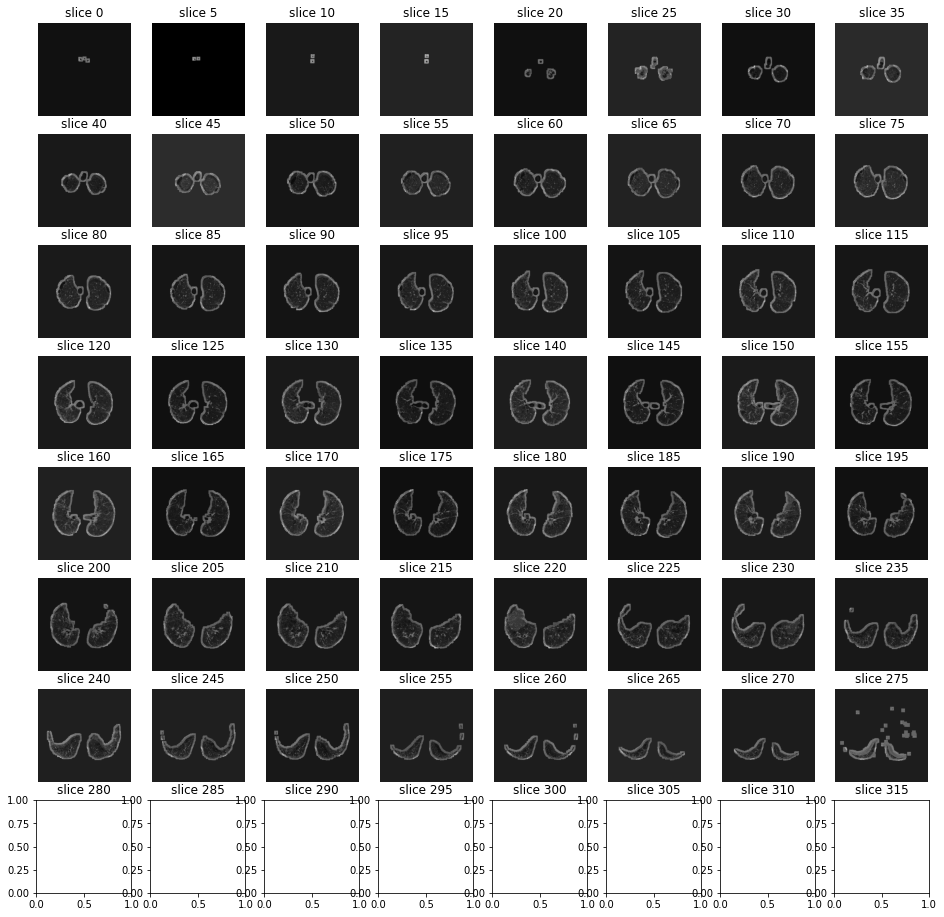

In [147]:
OUTPUT_PATH_LUNG_MASK_IMAGES_1MM = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm/"
pat_id = "ID00419637202311204720264"
print(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
# sorted_images
slices = [Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L') for index, file in enumerate(sorted_images)]
if len(slices) > 100: dim = int(np.sqrt(int(len(slices)/10)))+1; show_every = 10
else: dim = int(np.sqrt(len(slices)/10))+1; show_every=1
print("\n\n########################## 1mm  PROCESSED DATA #################################")
# print(f"PATH --> {data_path}")
print(f"N Images --> {len(slices)}")
sample_stack(slices, rows=8, cols=8, start_with=0, show_every=5)
#              int(len(slices)/50))
# average_images(slices, n_imgs_after_average, width_average)

## plot image at particular percentile

71


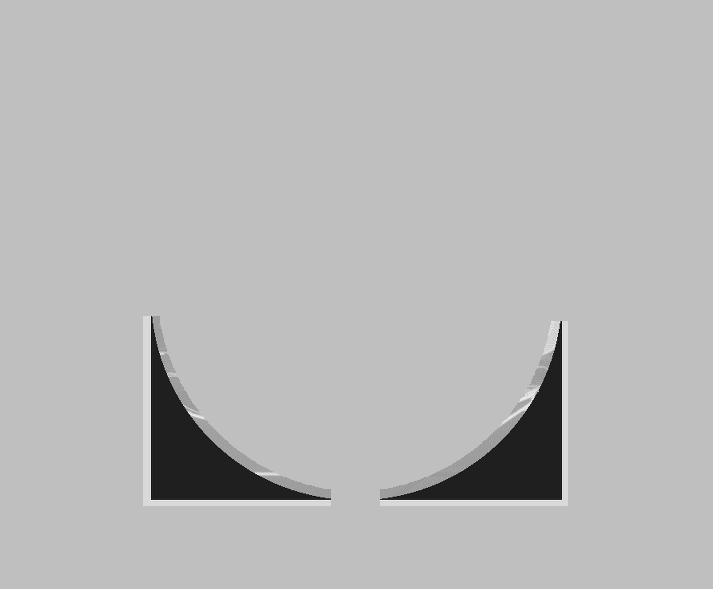

In [1508]:
perc = 0.2
index = int(len(slices) * perc)
print(index)
slices[index]

## Augmentations 

In [265]:
# ROT_ = 0
# SHR_ = 2.0
# HZOOM_ = 2
# WZOOM_ = 4
# HSHIFT_ = 2
# WSHIFT_ = 4


ROT_ = 0
SHR_ = 2.0
HZOOM_ = 8.0
WZOOM_ = 8.0
HSHIFT_ = 8.0
WSHIFT_ = 8.0

pat_id = "ID00423637202312137826377"
# combo = [0.2, 0.3]
# perc = np.random.choice(combo)
perc = 0.8
print(perc) 


0.8


### UDFs

In [266]:
def get_mat(rotation, shear, height_zoom, width_zoom, height_shift, width_shift):
    # returns 3x3 transformmatrix which transforms indicies
        
    # CONVERT DEGREES TO RADIANS
    rotation = math.pi * rotation / 180.
    shear = math.pi * shear / 180.
    
    # ROTATION MATRIX
    c1 = tf.math.cos(rotation)
    s1 = tf.math.sin(rotation)
    one = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')
    rotation_matrix = tf.reshape( tf.concat([c1,s1,zero, -s1,c1,zero, zero,zero,one],axis=0),[3,3] )
        
    # SHEAR MATRIX
    c2 = tf.math.cos(shear)
    s2 = tf.math.sin(shear)
    shear_matrix = tf.reshape( tf.concat([one,s2,zero, zero,c2,zero, zero,zero,one],axis=0),[3,3] )    
    
    # ZOOM MATRIX
    zoom_matrix = tf.reshape( tf.concat([one/height_zoom,zero,zero, zero,one/width_zoom,zero, zero,zero,one],axis=0),[3,3] )
    
    # SHIFT MATRIX
    shift_matrix = tf.reshape( tf.concat([one,zero,height_shift, zero,one,width_shift, zero,zero,one],axis=0),[3,3] )
    
    return K.dot(K.dot(rotation_matrix, shear_matrix), K.dot(zoom_matrix, shift_matrix))


def transform(image, image_size):
    # input image - is one image of size [dim,dim,3] not a batch of [b,dim,dim,3]
    # output - image randomly rotated, sheared, zoomed, and shifted
    DIM = image_size[0]
    height = image_size[0]
    width = image_size[0]
    if height!= width:
        image = tf.image.resize(image, [DIM, DIM])
    XDIM = DIM%2 #fix for size 331
    
    rot = ROT_ * tf.random.normal([1], dtype='float32')
    shr = SHR_ * tf.random.normal([1], dtype='float32') 
    h_zoom = 1.0 + tf.random.normal([1], dtype='float32') / HZOOM_
    w_zoom = 1.0 + tf.random.normal([1], dtype='float32') / WZOOM_
    h_shift = HSHIFT_ * tf.random.normal([1], dtype='float32') 
    w_shift = WSHIFT_ * tf.random.normal([1], dtype='float32') 

    # GET TRANSFORMATION MATRIX
    m = get_mat(rot,shr,h_zoom,w_zoom,h_shift,w_shift) 

    # LIST DESTINATION PIXEL INDICES
    x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
    y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
    z = tf.ones([DIM*DIM],dtype='int32')
    
#     x = tf.repeat(tf.range(0, DIM))
#     y = tf.tile(tf.range(0,[DIM]))
#     z = tf.ones([DIM*DIM],dtype='int32')

    idx = tf.stack( [x,y,z] )
    
    # ROTATE DESTINATION PIXELS ONTO ORIGIN PIXELS
    idx2 = K.dot(m,tf.cast(idx,dtype='float32'))
    idx2 = K.cast(idx2,dtype='int32')
    idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)
#     idx2 = K.clip(idx2,0,DIM//2)

    
    # FIND ORIGIN PIXEL VALUES           
    idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
    d = tf.gather_nd(image,tf.transpose(idx3))
        
    return tf.reshape(d,[DIM,DIM,3])

def plot_image(image):
    plt.imshow(image, cmap="gray", interpolation="nearest")
    plt.axis("off")    

def preprocess(image):
    resized_image = tf.image.resize(image, [224, 224])
    final_image = keras.applications.vgg19.preprocess_input(resized_image*255)
    
    return final_image


### Original

/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm//ID00423637202312137826377
257
205
(355, 355)
(3, 355, 355, 1)
(355, 355, 3)
(224, 224, 3)


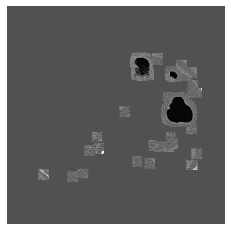

In [267]:
print(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}")
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
print(len(sorted_images))
# slices = [Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L') for index, file in enumerate(sorted_images)]    
index = int(len(sorted_images)*perc)
print(index)
image = tf.keras.preprocessing.image.img_to_array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
image = image[:, :, 0]
print(image.shape)
img_to_resize = tf.convert_to_tensor(image.reshape((*image.shape, 1)))
images = tf.convert_to_tensor([img_to_resize]*3)
print(images.shape)
images_reduced_mean = tf.reduce_mean(images, axis=3)
image_pre_proc = tf.stack([images_reduced_mean[0], images_reduced_mean[1], images_reduced_mean[2]], axis=-1)
print(image_pre_proc.shape)
# trans_image = transform(image_pre_proc, image_size = image_pre_proc.shape)
# trans_image = tf.image.random_flip_left_right(trans_image)
resized_image = preprocess(image_pre_proc)[:, :, 0]
out_img = tf.stack([resized_image, resized_image, resized_image], axis=-1)
print(out_img.shape)
plot_image(out_img[:, :, 0])


### generate sample augmentations

/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm//ID00423637202312137826377
257
205
(355, 355)


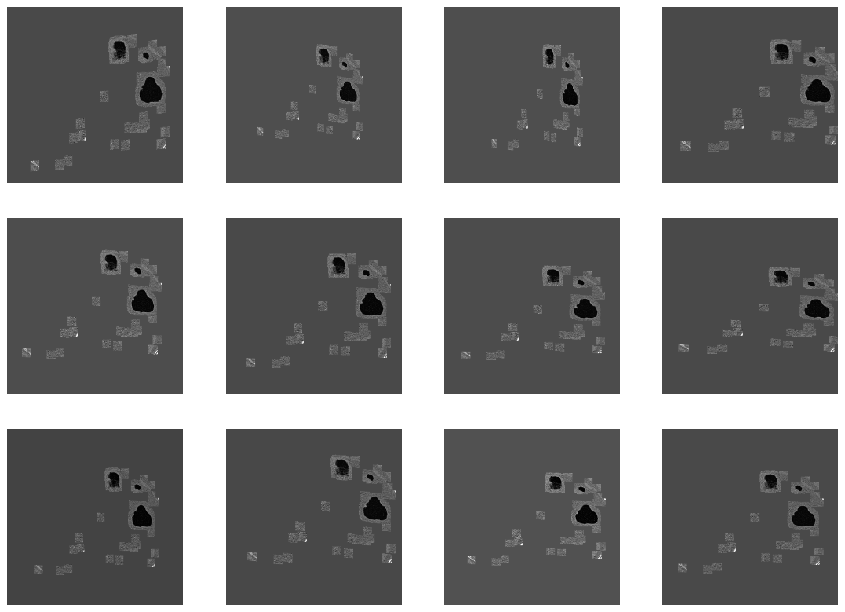

In [268]:
row = 3; col = 4;

# pat_id = "ID00419637202311204720264"
print(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}")
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
print(len(sorted_images))
# slices = [Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L') for index, file in enumerate(sorted_images)]    
index = int(len(sorted_images)*perc)
print(index)
image = tf.keras.preprocessing.image.img_to_array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
image = image[:, :, 0]
print(image.shape)
img_to_resize = tf.convert_to_tensor(image.reshape((*image.shape, 1)))
images = tf.convert_to_tensor([img_to_resize]*3)
# print(images.shape)
images_reduced_mean = tf.reduce_mean(images, axis=3)
image_pre_proc = tf.stack([images_reduced_mean[0], images_reduced_mean[1], images_reduced_mean[2]], axis=-1)

plt.figure(figsize=(15,int(15*row/col)))
for j in range(row*col):
    plt.subplot(row,col,j+1)
    plt.axis('off')
    trans_image = transform(image_pre_proc, image_pre_proc.shape)
    resized_image = tf.image.resize(trans_image, [224, 224])
#     print(resized_image.shape)
    plot_image(resized_image[:, :, 2])
plt.show()
# plot_image(transform(image_pre_proc)[:, :, 2])

## Montage

In [430]:
# perc=0.3
# Patient --> ID00419637202311204720264, Percentile Image --> 0.3
# Patient --> ID00421637202311550012437, Percentile Image --> 0.3
# Patient --> ID00422637202311677017371, Percentile Image --> 0.3
# Patient --> ID00423637202312137826377, Percentile Image --> 0.3
# Patient --> ID00426637202313170790466, Percentile Image --> 0.3

In [497]:
combo = [0.2, 0.3, 0.5, 0.7, 0.8]
perc = np.random.choice(combo, 4, replace=False)
perc

array([0.2, 0.3, 0.8, 0.5])

/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm//ID00419637202311204720264
280
[0.2, 0.3, 0.5, 0.7]
(512, 512, 3)
(512, 512, 3)


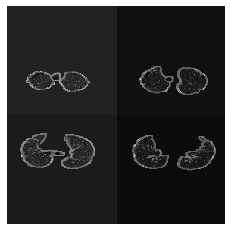

In [488]:
image_size = 512
combo = [0.2, 0.3, 0.5, 0.7, 0.8]
perc = np.random.choice(combo, 4, replace=False)
perc = [0.2, 0.3, 0.5, 0.7]


ROT_ = 0
SHR_ = 2.0
HZOOM_ = 8.0
WZOOM_ = 8.0
HSHIFT_ = 8.0
WSHIFT_ = 8.0

pat_id = "ID00419637202311204720264"


print(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}")
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
print(len(sorted_images))



inputImages = []
print(perc)

for perc_tmp in perc:
    index = int(len(sorted_images)*perc_tmp)
    image = tf.keras.preprocessing.image.img_to_array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/25
#     print(image.shape)
#     image = image[:, :, 0]
    resized_image = tf.image.resize(image, [256, 256])
    inputImages.append(resized_image[:, :, 0])
    
final_image = np.zeros((512, 512))
final_image[0:256, 0:256] = inputImages[0]
final_image[0:256, 256:512] = inputImages[1]
final_image[256:512, 0:256] = inputImages[2]
final_image[256:512, 256:512] = inputImages[3]
image = final_image
# print(image.shape)
img_to_resize = tf.convert_to_tensor(image.reshape((*image.shape, 1)))
# print(img_to_resize.shape)
images = tf.convert_to_tensor([img_to_resize]*3)
# print(images.shape)
images_reduced_mean = tf.reduce_mean(images, axis=3)
image_pre_proc = tf.stack([images_reduced_mean[0], images_reduced_mean[1], images_reduced_mean[2]], axis=-1)
# print(image_pre_proc.shape)
trans_image = transform(image_pre_proc, image_size = image_pre_proc.shape)
resized_image = tf.image.resize(trans_image, [image_size, image_size])[:, :, 0]
final_image = keras.applications.xception.preprocess_input(resized_image*255)
print(trans_image.shape)
# resized_image = preprocess(trans_image)[:, :, 0]
out_img = tf.stack([resized_image, resized_image, resized_image], axis=-1)
print(out_img.shape)
plot_image(out_img[:, :, 0])



# Update Image Index Patient Level

## check 30th %ile images 

In [121]:
# OUTPUT_PATH = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/"
# OUTPUT_PATH_LUNG_MASK_IMAGES_1MM = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm/"
FOLD = 0
junk_patients = [ "ID00170637202238079193844","ID00090637202204766623410"] # no good percentile index [0.2, 0.3, 0.7] for these 2 Patient 


In [122]:
df_folds_5 = pd.read_csv(f'{OUTPUT_PATH_CSV}/osic_4_folds.csv')
print(f"Unique Folds --> {df_folds_5.fold.unique()}")
df_folds_5.head()

Unique Folds --> [1 3 2 0]


,Patient,Male,Female,Ex-smoker,Never smoked,Currently smokes,age,week,base_fvc,FVC,fold
0,ID00007637202177411956430,1,0,1,0,0,0.769231,0.179012,0.241456,2315.0,1
1,ID00007637202177411956430,1,0,1,0,0,0.769231,0.234568,0.241456,2214.0,1
2,ID00007637202177411956430,1,0,1,0,0,0.769231,0.246914,0.241456,2061.0,1
3,ID00007637202177411956430,1,0,1,0,0,0.769231,0.259259,0.241456,2144.0,1
4,ID00007637202177411956430,1,0,1,0,0,0.769231,0.271605,0.241456,2069.0,1


In [123]:
df_train = df_folds_5[df_folds_5.fold !=FOLD].reset_index(drop=True)
df_valid = df_folds_5[df_folds_5.fold ==FOLD].reset_index(drop=True)
print(f"Train Patient Count --> {df_train.Patient.nunique()}")
print(f"Validation Patient Count --> {df_valid.Patient.nunique()}")

df_train = df_train[~df_train.Patient.isin(junk_patients)].reset_index(drop=True)
df_train = df_train.sample(frac=1).reset_index(drop=True)
df_valid = df_valid[~df_valid.Patient.isin(junk_patients)].reset_index(drop=True)
t_p = df_train.Patient.unique()
v_p = df_valid.Patient.unique()
common_patients = [x for x in t_p if x in v_p]
print("### After dropping 6 Patients with 1mm Image issue....")
print(f"Train Patient Count --> {df_train.Patient.nunique()}")
print(f"Validation Patient Count --> {df_valid.Patient.nunique()}")
print(f"Common Patients --> {common_patients}")

Train Patient Count --> 126
Validation Patient Count --> 43
### After dropping 6 Patients with 1mm Image issue....
Train Patient Count --> 124
Validation Patient Count --> 43
Common Patients --> []


### Train 

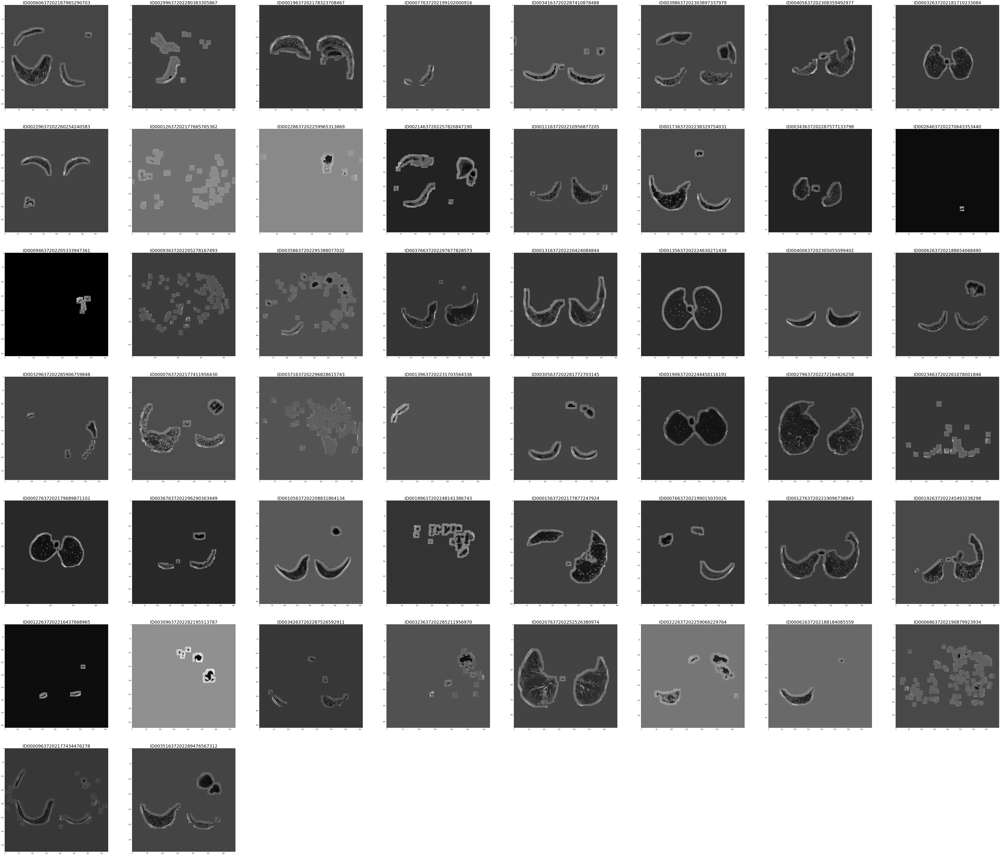

In [272]:
#########
perc = .8
w=10
h=10
fig=plt.figure(figsize=(125, 125))
columns = 8
rows = 8
ax = []
for i, pat_id in enumerate(t_p[0:50]):
    images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
    sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
    index = int(len(sorted_images)*perc)
    image = np.array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
    ax.append(fig.add_subplot(rows, columns, i+1))
    ax[-1].set_title(pat_id, size="40")
#     plt.title("PATIENT:" + str(pat_id), size="40")
    plt.imshow(image,cmap="gray")
    plt.title(pat_id, fontdict={'fontsize': 30})
plt.show() 


### Valid

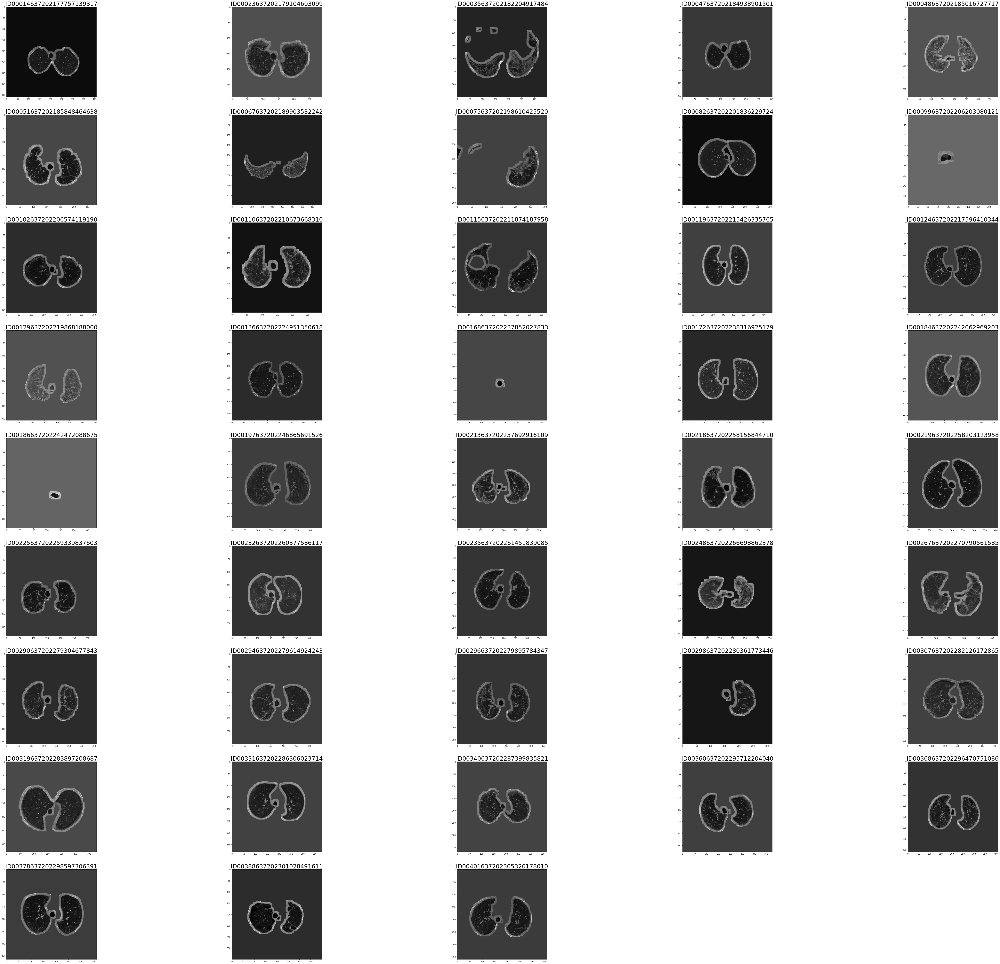

In [273]:
#########
perc = .30
w=10
h=10
fig=plt.figure(figsize=(100, 100))
columns = 5
rows = 10
ax = []
for i, pat_id in enumerate(v_p):
    images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
    sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
    index = int(len(sorted_images)*perc)
    image = np.array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
    ax.append(fig.add_subplot(rows, columns, i+1))
    ax[-1].set_title(pat_id, size="40")
#     plt.title("PATIENT:" + str(pat_id), size="40")
    plt.imshow(image,cmap="gray")
    plt.title(pat_id, fontdict={'fontsize': 30})
plt.show() 


In [274]:
shit_pats = ["ID00168637202237852027833", "ID00123637202217151272140", "ID00099637202206203080121",
"ID00108637202209619669361", "ID00190637202244450116191", "ID00285637202278913507108", 
"ID00135637202224630271439", "ID00020637202178344345685",  "ID00027637202179689871102",      
"ID00371637202296828615743", "ID00035637202182204917484", "ID00109637202210454292264",
"ID00233637202260580149633", "ID00089637202204675567570", "ID00032637202181710233084",
"ID00186637202242472088675", "ID00393637202302431697467"]
print(len(shit_pats))
print(len(set(shit_pats)))
shit_pats[7]

17
17


'ID00020637202178344345685'

## check 20th %ile patient level

In [130]:
perc=0.7
pat_id = "ID00170637202238079193844"
# pat_id = df_train.Patient.unique()[152]
print(pat_id)

ID00170637202238079193844


/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm//ID00170637202238079193844
92
64
(322, 322)
(3, 322, 322, 1)
(322, 322, 3)
(512, 512, 3)


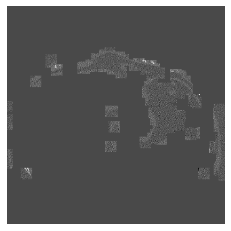

In [131]:
print(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}")
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
print(len(sorted_images))
index = int(len(sorted_images)*perc)
print(index)
image = tf.keras.preprocessing.image.img_to_array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
image = image[:, :, 0]
print(image.shape)
img_to_resize = tf.convert_to_tensor(image.reshape((*image.shape, 1)))
images = tf.convert_to_tensor([img_to_resize]*3)
print(images.shape)
images_reduced_mean = tf.reduce_mean(images, axis=3)
image_pre_proc = tf.stack([images_reduced_mean[0], images_reduced_mean[1], images_reduced_mean[2]], axis=-1)
print(image_pre_proc.shape)
# trans_image = transform(image_pre_proc, image_size = image_pre_proc.shape)
resized_image = preprocess(image_pre_proc, aug=False)[:, :, 0]
out_img = tf.stack([resized_image, resized_image, resized_image], axis=-1)
print(out_img.shape)
plot_image(out_img[:, :, 0])


## check 70th %ile patient level

In [2235]:
perc=0.70

/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm//ID00075637202198610425520
169
118
(307, 307)
(3, 307, 307, 1)
(307, 307, 3)
(224, 224, 3)


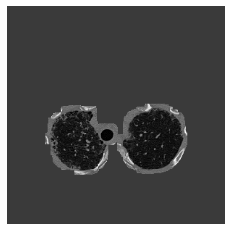

In [2228]:
print(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}")
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
print(len(sorted_images))
index = int(len(sorted_images)*perc)
print(index)
image = tf.keras.preprocessing.image.img_to_array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
image = image[:, :, 0]
print(image.shape)
img_to_resize = tf.convert_to_tensor(image.reshape((*image.shape, 1)))
images = tf.convert_to_tensor([img_to_resize]*3)
print(images.shape)
images_reduced_mean = tf.reduce_mean(images, axis=3)
image_pre_proc = tf.stack([images_reduced_mean[0], images_reduced_mean[1], images_reduced_mean[2]], axis=-1)
print(image_pre_proc.shape)
# trans_image = transform(image_pre_proc, image_size = image_pre_proc.shape)
resized_image = preprocess(image_pre_proc)[:, :, 0]
out_img = tf.stack([resized_image, resized_image, resized_image], axis=-1)
print(out_img.shape)
plot_image(out_img[:, :, 0])


## Patient level all images

In [1795]:
pat_id = "ID00090637202204766623410"

In [2219]:
# print(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
# print(pat_id)
# images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
# sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
# # sorted_images
# slices = [Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L') for index, file in enumerate(sorted_images)]
# if len(slices) > 100: dim = int(np.sqrt(int(len(slices)/10)))+1; show_every = 10
# else: dim = int(np.sqrt(len(slices)/10))+1; show_every=1
# print("\n\n########################## 1mm  PROCESSED DATA #################################")
# # print(f"PATH --> {data_path}")
# print(f"N Images --> {len(slices)}")
# sample_stack(slices, rows=8, cols=8, start_with=0, show_every=5)
# #              int(len(slices)/50))
# # average_images(slices, n_imgs_after_average, width_average)

## Patients with bad/okay/okayish 30% ile Images

In [2207]:
all_relev_patients = [
"ID00168637202237852027833", "ID00123637202217151272140", "ID00099637202206203080121",
"ID00108637202209619669361", "ID00190637202244450116191", "ID00285637202278913507108", 
"ID00135637202224630271439", "ID00020637202178344345685",  "ID00027637202179689871102",      
"ID00371637202296828615743", "ID00035637202182204917484", "ID00109637202210454292264",
"ID00233637202260580149633", "ID00089637202204675567570", "ID00032637202181710233084",
"ID00186637202242472088675", "ID00393637202302431697467"]
print(len(all_relev_patients))
print(len(set(all_relev_patients)))

17
17


### Model Input Images

In [2248]:
perc = 0.3

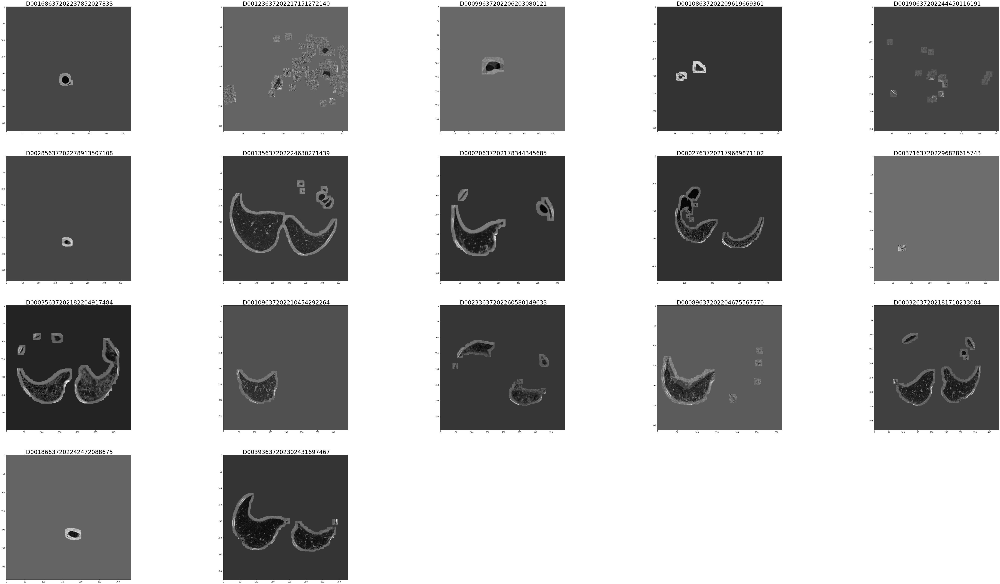

In [2249]:
#########
w=10
h=10
fig=plt.figure(figsize=(100, 100))
columns = 5
rows = 7
ax = []
for i, pat_id in enumerate(all_relev_patients):
    images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
    sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
    index = int(len(sorted_images)*perc)
    image = np.array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
    ax.append(fig.add_subplot(rows, columns, i+1))
    ax[-1].set_title(pat_id, size="40")
    plt.imshow(image,cmap="gray")
    plt.title(pat_id, fontdict={'fontsize': 30})
plt.show() 


## NEW PATIENT LEVEL IMAGES

In [9]:
dynamic_index_patients = ["ID00168637202237852027833", "ID00123637202217151272140", "ID00099637202206203080121",
"ID00108637202209619669361", "ID00190637202244450116191", "ID00285637202278913507108", 
"ID00135637202224630271439", "ID00020637202178344345685",  "ID00027637202179689871102",      
"ID00371637202296828615743", "ID00035637202182204917484", "ID00109637202210454292264",
"ID00233637202260580149633", "ID00089637202204675567570", "ID00032637202181710233084",
"ID00186637202242472088675", "ID00393637202302431697467"]


patients_image_perc_20 = ["ID00168637202237852027833","ID00099637202206203080121", 
                          "ID00285637202278913507108", "ID00371637202296828615743", 
                          "ID00186637202242472088675"]

patients_image_perc_70 = ["ID00123637202217151272140", "ID00108637202209619669361",
"ID00190637202244450116191", "ID00135637202224630271439",
"ID00020637202178344345685", "ID00027637202179689871102",
"ID00035637202182204917484", "ID00109637202210454292264",
"ID00233637202260580149633", "ID00089637202204675567570",
"ID00032637202181710233084", "ID00393637202302431697467",
"ID00075637202198610425520"]


Patient --> ID00168637202237852027833, Percentile Image --> 0.2
Patient --> ID00123637202217151272140, Percentile Image --> 0.7
Patient --> ID00099637202206203080121, Percentile Image --> 0.2
Patient --> ID00108637202209619669361, Percentile Image --> 0.7
Patient --> ID00190637202244450116191, Percentile Image --> 0.7
Patient --> ID00285637202278913507108, Percentile Image --> 0.2
Patient --> ID00135637202224630271439, Percentile Image --> 0.7
Patient --> ID00020637202178344345685, Percentile Image --> 0.7
Patient --> ID00027637202179689871102, Percentile Image --> 0.7
Patient --> ID00371637202296828615743, Percentile Image --> 0.2
Patient --> ID00035637202182204917484, Percentile Image --> 0.7
Patient --> ID00109637202210454292264, Percentile Image --> 0.7
Patient --> ID00233637202260580149633, Percentile Image --> 0.7
Patient --> ID00089637202204675567570, Percentile Image --> 0.7
Patient --> ID00032637202181710233084, Percentile Image --> 0.7
Patient --> ID00186637202242472088675, P

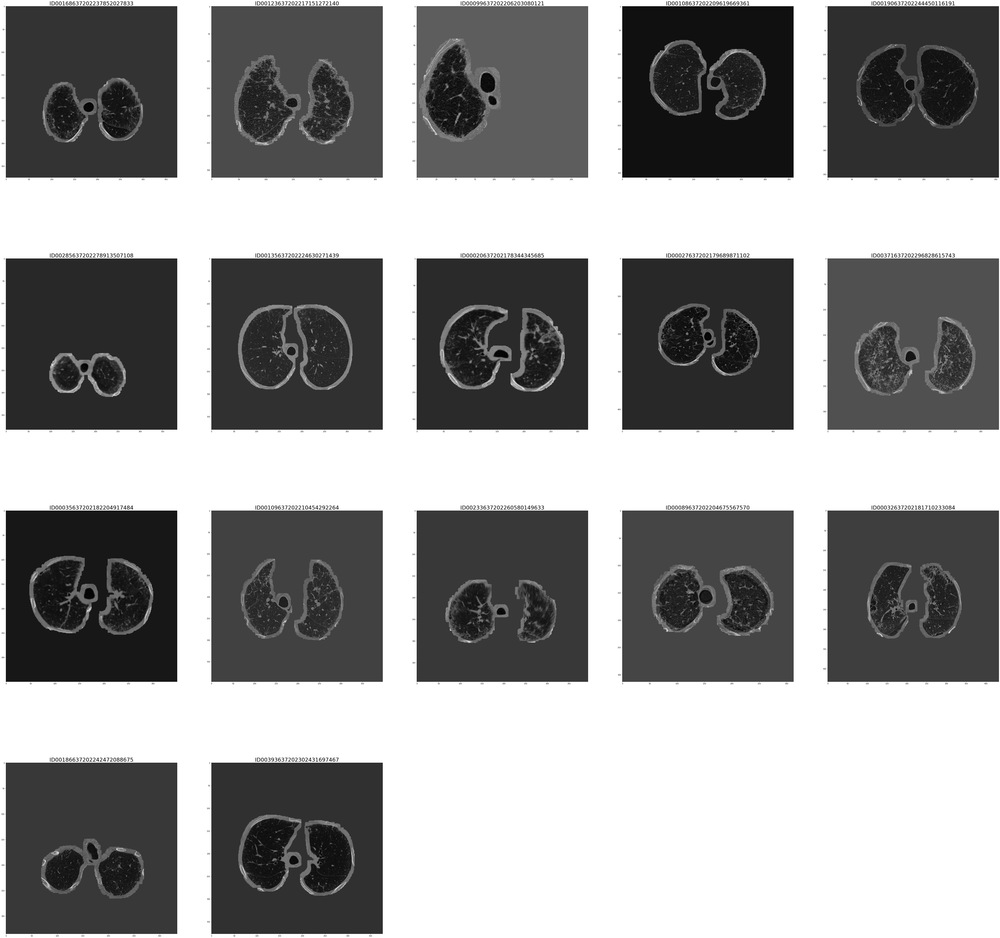

In [10]:
w=10
h=10
fig=plt.figure(figsize=(100, 100))
columns = 5
rows = 4
ax = []
for i, pat_id in enumerate(dynamic_index_patients):
    images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
    sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
#     if pat_id in patients_image_perc_20:
#         perc = 0.2
#     elif pat_id in patients_image_perc_70:
#         perc = 0.7
#     else:
    perc = 0.3
    index = int(len(sorted_images)*perc)
    print(f"Patient --> {pat_id}, Percentile Image --> {perc}")
    image = np.array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
    ax.append(fig.add_subplot(rows, columns, i+1))
    ax[-1].set_title(pat_id, size="40")
#     plt.title("PATIENT:" + str(pat_id), size="40")
    plt.imshow(image,cmap="gray")
    plt.title(pat_id, fontdict={'fontsize': 30})
plt.show() 


In [11]:

#########
print(f"Percentile --> {perc}")
w=10
h=10
fig=plt.figure(figsize=(100, 100))
columns = 10
rows = 20
ax = []
for i, pat_id in enumerate(df_folds_5.Patient.unique()):
    images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
    sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
    if pat_id in patients_image_perc_20:
        perc = 0.2
    elif pat_id in patients_image_perc_70:
        perc = 0.7
    else:
        perc = 0.3
    index = int(len(sorted_images)*perc)
    print(f"Patient --> {pat_id}, Percentile Image --> {perc}")
    image = np.array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
    ax.append(fig.add_subplot(rows, columns, i+1))
    ax[-1].set_title(pat_id, size="40")
#     plt.title("PATIENT:" + str(pat_id), size="40")
    plt.imshow(image,cmap="gray")
    plt.title(pat_id, fontdict={'fontsize': 30})
plt.show() 


Percentile --> 0.7


NameError: name 'df_folds_5' is not defined

<Figure size 7200x7200 with 0 Axes>

# PLAYGROUND

## Test Images

In [62]:
OUTPUT_PATH_LUNG_MASK_IMAGES_1MM = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm/"


In [63]:
df_test = pd.read_csv(f'{OUTPUT_PATH}/osic_test.csv')
print(df_test.shape)
df_test.head()

(44, 10)


,Patient,Male,Female,Ex-smoker,Never smoked,Currently smokes,age,week,base_fvc,FVC
0,ID00419637202311204720264,1,0,1,0,0,0.615385,0.179012,0.3724,3020.0
1,ID00419637202311204720264,1,0,1,0,0,0.615385,0.185185,0.3724,2859.0
2,ID00419637202311204720264,1,0,1,0,0,0.615385,0.197531,0.3724,2783.0
3,ID00419637202311204720264,1,0,1,0,0,0.615385,0.203704,0.3724,2719.0
4,ID00419637202311204720264,1,0,1,0,0,0.615385,0.222222,0.3724,2738.0


In [64]:
test_p = df_test.Patient.unique()
[x for x in test_p if x in dynamic_index_patients]

[]

Patient --> ID00419637202311204720264, Percentile Image --> 0.3
Patient --> ID00421637202311550012437, Percentile Image --> 0.3
Patient --> ID00422637202311677017371, Percentile Image --> 0.3
Patient --> ID00423637202312137826377, Percentile Image --> 0.3
Patient --> ID00426637202313170790466, Percentile Image --> 0.3


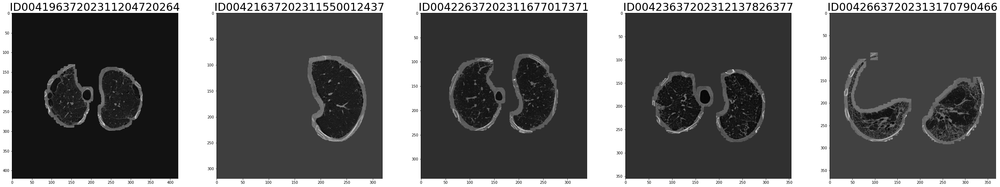

In [65]:
w=10
h=10
fig=plt.figure(figsize=(100, 100))
columns = 10
rows = 10
ax = []
for i, pat_id in enumerate(test_p):
    images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
    sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
    if pat_id in patients_image_perc_20:
        perc = 0.2
    elif pat_id in patients_image_perc_70:
        perc = 0.7
    else:
        perc = 0.3
    index = int(len(sorted_images)*perc)
    print(f"Patient --> {pat_id}, Percentile Image --> {perc}")
    image = np.array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
    ax.append(fig.add_subplot(rows, columns, i+1))
    ax[-1].set_title(pat_id, size="40")
#     plt.title("PATIENT:" + str(pat_id), size="40")
    plt.imshow(image,cmap="gray")
    plt.title(pat_id, fontdict={'fontsize': 30})
plt.show() 


In [135]:
pat_id = "ID00094637202205333947361"


# ID00419637202311204720264 - Test
# ID00094637202205333947361
# ID00086637202203494931510
# ID00014637202177757139317
# ID00067637202189903532242 - 0.7
# ID00240637202264138860065
# ID00122637202216437668965

/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm/ID00094637202205333947361


########################## 1mm  PROCESSED DATA #################################
N Images --> 167


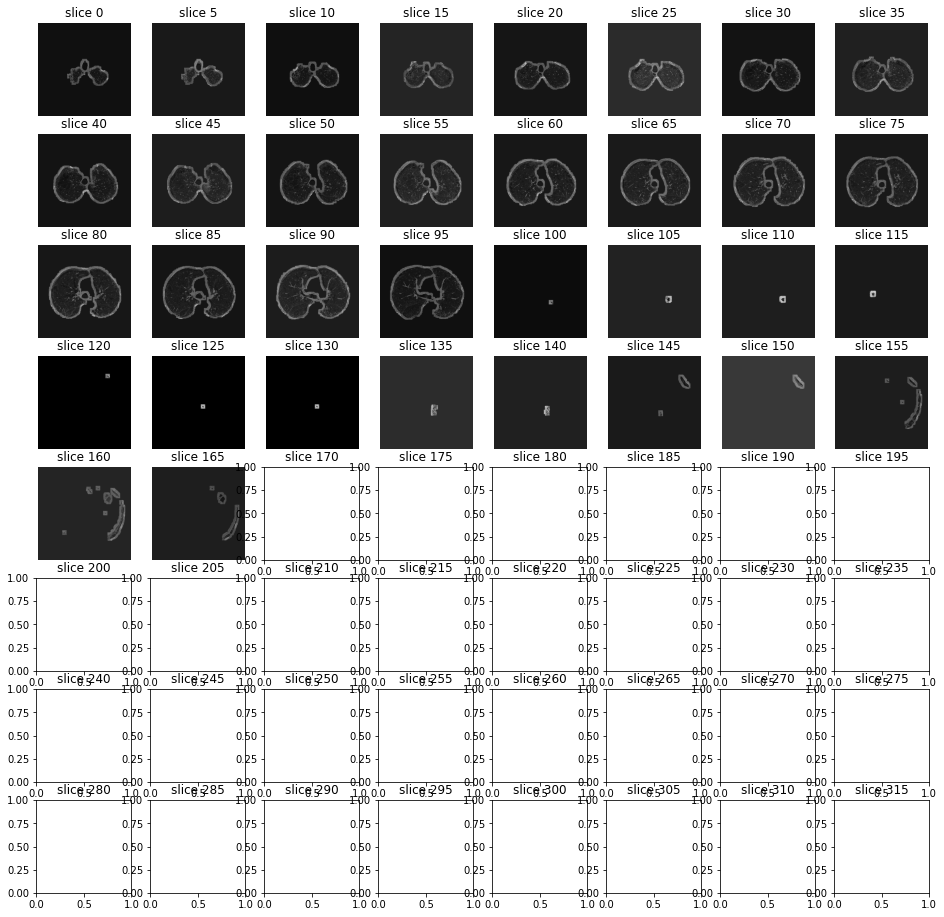

In [139]:
OUTPUT_PATH_LUNG_MASK_IMAGES_1MM = "/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm/"
# OUTPUT_PATH_LUNG_MASK_IMAGES_1MM = "/Users/paritoshgupta/Desktop/pats_7_new_images/"

print(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
# sorted_images
slices = [Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L') for index, file in enumerate(sorted_images)]
if len(slices) > 100: dim = int(np.sqrt(int(len(slices)/10)))+1; show_every = 10
else: dim = int(np.sqrt(len(slices)/10))+1; show_every=1
print("\n\n########################## 1mm  PROCESSED DATA #################################")
# print(f"PATH --> {data_path}")
print(f"N Images --> {len(slices)}")
# sample_stack(slices, rows=8, cols=8, start_with=0, show_every=1)
sample_stack(slices, rows=8, cols=8, start_with=0, show_every=5)

#              int(len(slices)/50))
# average_images(slices, n_imgs_after_average, width_average)

## Patient level percentile image

In [144]:
perc=0.7
# pat_id = "ID00094637202205333947361"
# pat_id = df_train.Patient.unique()[152]
print(pat_id)
image_size = 512

ID00094637202205333947361


/Users/paritoshgupta/Desktop/aamlp/aamlp/input/osic-pulmonary-fibrosis-progression/ads/lung_mask_1mm//ID00094637202205333947361
167
116
(360, 360)
(3, 360, 360, 1)
(360, 360, 3)
(512, 512, 3)


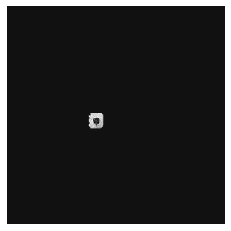

In [145]:
print(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}")
images = os.listdir(os.path.join(OUTPUT_PATH_LUNG_MASK_IMAGES_1MM, pat_id))
sorted_images = sorted(images,key=lambda x: int(os.path.splitext(x)[0]))
print(len(sorted_images))
index = int(len(sorted_images)*perc)
print(index)
image = tf.keras.preprocessing.image.img_to_array(Image.open(f"{OUTPUT_PATH_LUNG_MASK_IMAGES_1MM}/{pat_id}/{sorted_images[index]}").convert('L'))/255
image = image[:, :, 0]
print(image.shape)
img_to_resize = tf.convert_to_tensor(image.reshape((*image.shape, 1)))
images = tf.convert_to_tensor([img_to_resize]*3)
print(images.shape)
images_reduced_mean = tf.reduce_mean(images, axis=3)
image_pre_proc = tf.stack([images_reduced_mean[0], images_reduced_mean[1], images_reduced_mean[2]], axis=-1)
print(image_pre_proc.shape)
# trans_image = transform(image_pre_proc, image_size = image_pre_proc.shape)
resized_image = preprocess(image_pre_proc, aug=False)[:, :, 0]
out_img = tf.stack([resized_image, resized_image, resized_image], axis=-1)
print(out_img.shape)
plot_image(out_img[:, :, 0])


In [ ]:
a = [1,2,3,]